### 초기 경로 설정 (클래스 이용을 위함)

In [1]:
%cd /project/segmentation/smcho1201/segmentation_project

/project/segmentation/ehdgus575/segmentation_project


In [2]:
# files and system
import os
import sys
import time
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from IPython.display import clear_output
# working with images
import cv2
import imageio
import scipy.ndimage
# import skimage.transform

import torchvision.transforms as transforms

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F


import torchsummary
from tqdm import notebook

sys.path.insert(0, '..')

# losses
from utils.metrics import iou_pytorch_eval, IoULoss, IoUBCELoss, DiceBCELoss , dice_pytorch_eval
from utils.metrics import iou_pytorch_test, dice_pytorch_test, precision_pytorch_test, recall_pytorch_test, fbeta_pytorch_test, accuracy_pytorch_test

# dataset
from utils.dataset import myDataSet

## 랜덤성을 배제한 환경 고정

In [4]:
random_seed= 42
random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True

In [5]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu") # select device for training, i.e. gpu or cpu
print(DEVICE)

cuda


# 1. Image augentation
> 실험할 때는 아예 augmentation도 고정시켜서 저장한 이미지를 사용해야 함.

In [6]:
_size = 224, 224
resize = transforms.Resize(_size, interpolation=0)

# set your transforms 
train_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                           transforms.RandomRotation(180),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(_size, padding = 10), # needed after rotation (with original size)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                       ])

/home/ehdgus575/.conda/envs/cuda_setting/lib/python3.9/site-packages/torchvision/transforms/transforms.py:332: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


# 2. 데이터셋 클래스 생성
> 해당 클래스는 이용하려는 이미지와 라벨의 모든 경로(/data/segmentation/...)의 리스트를 인자로 받는다.   

In [7]:
train_images = glob.glob('/data/segmentation/breast-cancer/trainset_malignant/images/*')
train_labels = glob.glob('/data/segmentation/breast-cancer/trainset_malignant/labels/*')
train_images = [img for img in train_images if img.find('jpg')!= -1] # super pixels 이미지 제외

valid_images = glob.glob('/data/segmentation/breast-cancer/validationset_malignant/images/*')
valid_labels = glob.glob('/data/segmentation/breast-cancer/validationset_malignant/labels/*')
valid_images = [img for img in valid_images if img.find('jpg')!= -1] # super pixels 이미지 제외

train_images = sorted(train_images)
train_labels = sorted(train_labels)

valid_images = sorted(valid_images)
valid_labels = sorted(valid_labels)

# 데이터셋 클래스 적용
custom_dataset_train = myDataSet(train_images, train_labels, transforms=test_transforms)
print("My custom training-dataset has {} elements".format(len(custom_dataset_train)))

custom_dataset_val = myDataSet(valid_images, valid_labels, transforms=test_transforms)
print("My custom valing-dataset has {} elements".format(len(custom_dataset_val)))

My custom training-dataset has 126 elements
My custom valing-dataset has 42 elements


### dataset class check
> RGB 채널 평균 값이라 색 바뀜

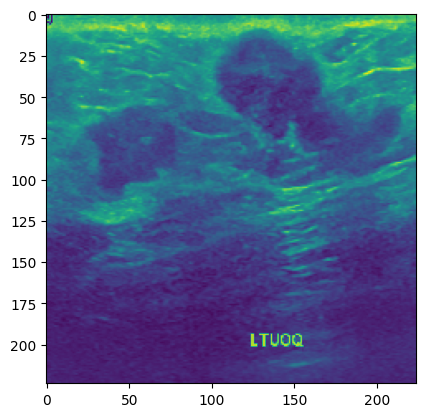

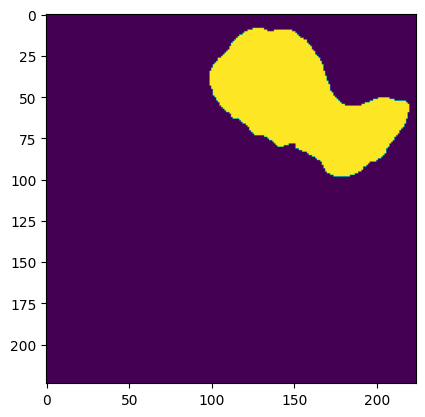

3픽셀의 평균값이라 색깔이 변경됨.


In [8]:
# Show example images.
image_number = 23
img, mask = custom_dataset_train.__getitem__(image_number)

# image
plt.figure()
plt.imshow(img.mean(0)) # 3 channels, take mean

# mask
plt.figure()
plt.imshow(mask[0, :, :]) # 1 channel, take it

plt.show()
print('3픽셀의 평균값이라 색깔이 변경됨.')

# 3. 모델 클래스 생성

In [9]:
from models.ESFPNet.ESFPmodel import ESFPNetStructure

model = ESFPNetStructure(embedding_dim = 224)
model = model.to(DEVICE)

successfully loaded!!!!


# 4. 하이퍼 파라미터 세팅 & 데이터 로더 생성

In [10]:
# Define variables for the training
epochs = 100
patience = 20
BATCH_SIZE = 8

dataloader_train = torch.utils.data.DataLoader(custom_dataset_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
dataloader_val = torch.utils.data.DataLoader(custom_dataset_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [11]:
# Define optimiser and criterion for the training. You can try different ones to see which works best for your data and task
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4, weight_decay = 1e-8)

criterion = DiceBCELoss()
model_name = 'ESFPNet'
data_name = 'malignant'

# 5. Training

/home/ehdgus575/.conda/envs/cuda_setting/lib/python3.9/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


 Epoch: 1 of 100, Iter.: 16 of 16, Train Loss: 1.003545, IoU: 0.211438, Dice: 0.286683
 Epoch: 1 of 100, Iter.: 16 of 16, Valid Loss: 0.681971, IoU: 0.438727, Dice: 0.575747

시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.


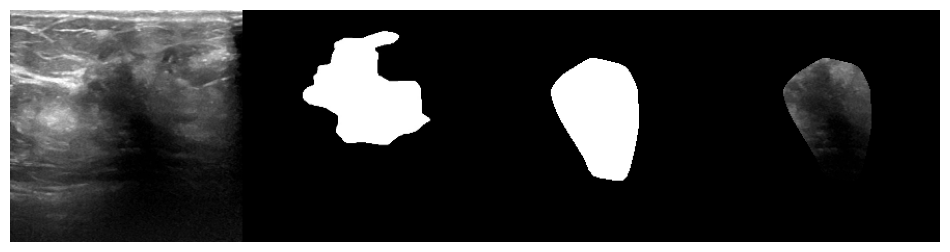

 Epoch: 2 of 100, Iter.: 16 of 16, Train Loss: 0.728313, IoU: 0.428163, Dice: 0.558131
 Epoch: 2 of 100, Iter.: 16 of 16, Valid Loss: 0.622153, IoU: 0.472932, Dice: 0.606503


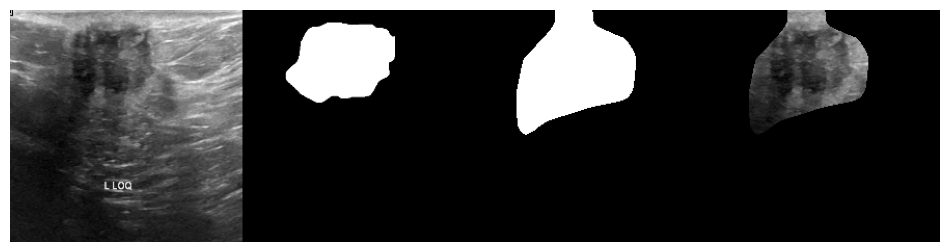

 Epoch: 3 of 100, Iter.: 16 of 16, Train Loss: 0.596315, IoU: 0.501452, Dice: 0.637367
 Epoch: 3 of 100, Iter.: 16 of 16, Valid Loss: 0.611805, IoU: 0.474022, Dice: 0.609292


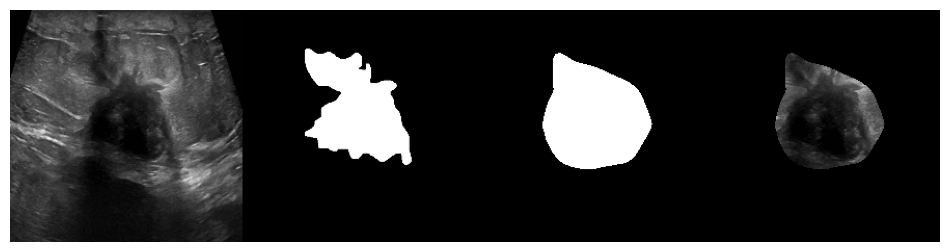

 Epoch: 4 of 100, Iter.: 16 of 16, Train Loss: 0.549499, IoU: 0.532557, Dice: 0.658097
 Epoch: 4 of 100, Iter.: 16 of 16, Valid Loss: 0.594897, IoU: 0.485454, Dice: 0.619955


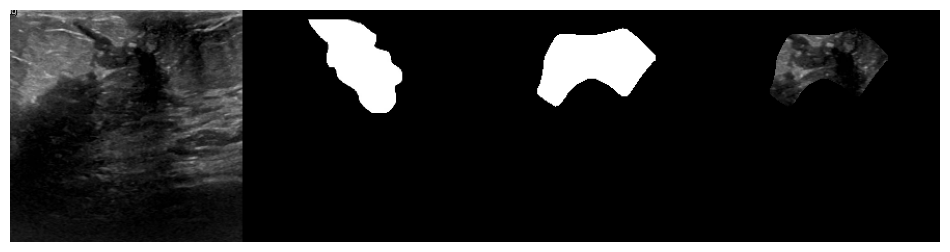

 Epoch: 5 of 100, Iter.: 16 of 16, Train Loss: 0.493298, IoU: 0.551520, Dice: 0.673824
 Epoch: 5 of 100, Iter.: 16 of 16, Valid Loss: 0.513688, IoU: 0.535380, Dice: 0.664028


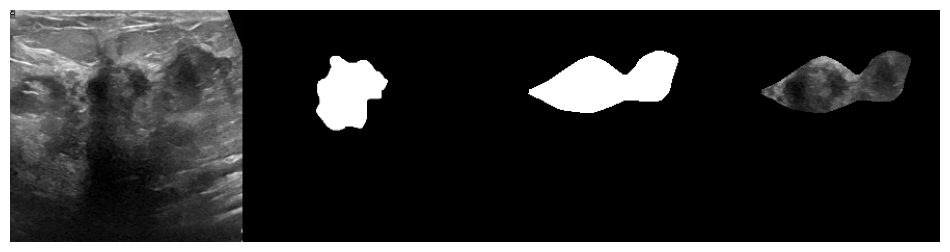

 Epoch: 6 of 100, Iter.: 16 of 16, Train Loss: 0.410900, IoU: 0.595549, Dice: 0.716979
 Epoch: 6 of 100, Iter.: 16 of 16, Valid Loss: 0.512750, IoU: 0.545173, Dice: 0.671998


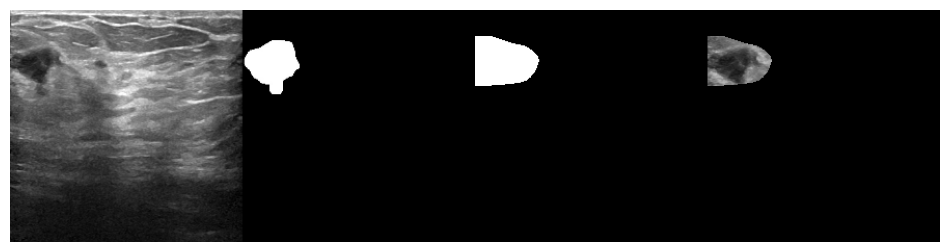

 Epoch: 7 of 100, Iter.: 16 of 16, Train Loss: 0.377739, IoU: 0.624439, Dice: 0.742009
 Epoch: 7 of 100, Iter.: 16 of 16, Valid Loss: 0.529280, IoU: 0.539640, Dice: 0.669206


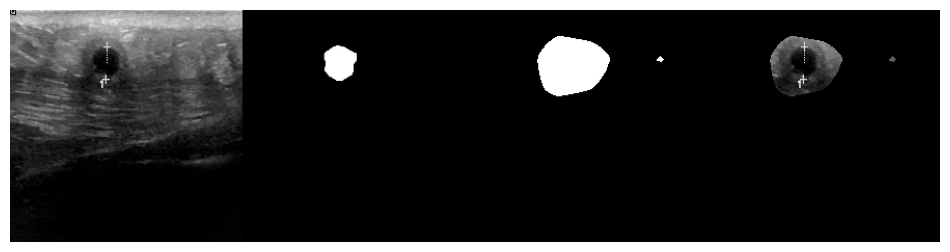

 Epoch: 8 of 100, Iter.: 16 of 16, Train Loss: 0.332086, IoU: 0.653727, Dice: 0.766758
 Epoch: 8 of 100, Iter.: 16 of 16, Valid Loss: 0.479107, IoU: 0.561716, Dice: 0.683529


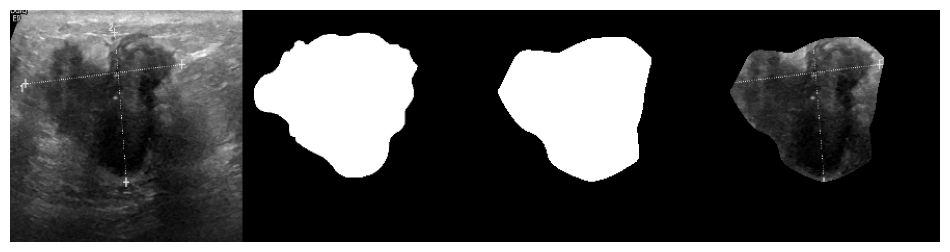

 Epoch: 9 of 100, Iter.: 16 of 16, Train Loss: 0.306660, IoU: 0.671718, Dice: 0.781154
 Epoch: 9 of 100, Iter.: 16 of 16, Valid Loss: 0.530804, IoU: 0.540926, Dice: 0.663943


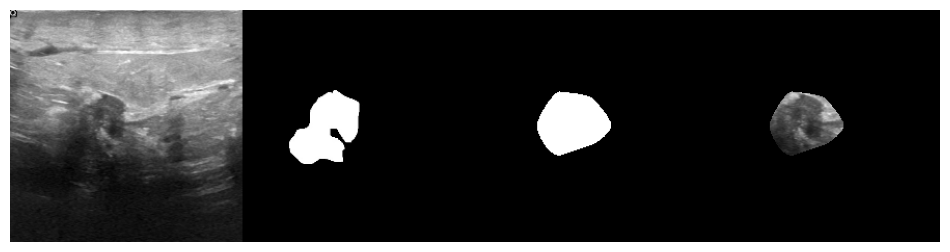

 Epoch: 10 of 100, Iter.: 16 of 16, Train Loss: 0.290761, IoU: 0.689449, Dice: 0.797276
 Epoch: 10 of 100, Iter.: 16 of 16, Valid Loss: 0.508385, IoU: 0.552547, Dice: 0.674843


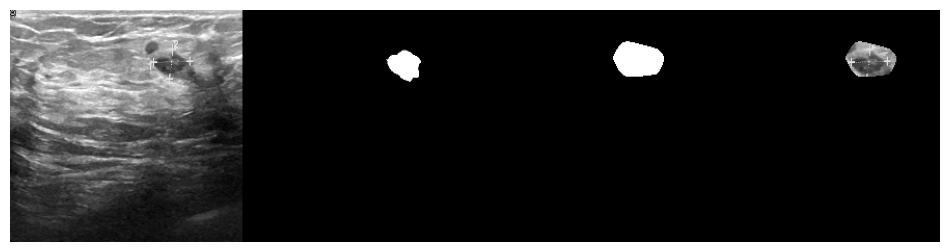

 Epoch: 11 of 100, Iter.: 16 of 16, Train Loss: 0.282718, IoU: 0.694025, Dice: 0.799627
 Epoch: 11 of 100, Iter.: 16 of 16, Valid Loss: 0.495796, IoU: 0.561274, Dice: 0.681359


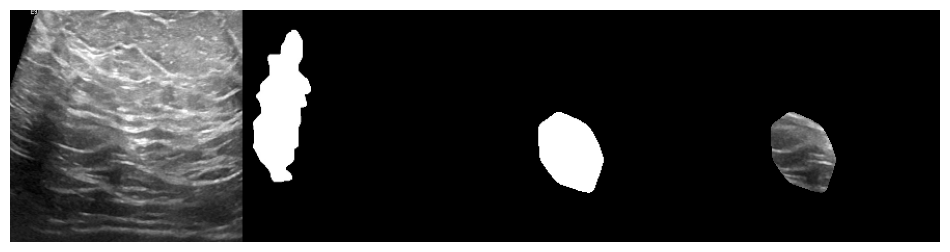

 Epoch: 12 of 100, Iter.: 16 of 16, Train Loss: 0.267835, IoU: 0.717745, Dice: 0.821952
 Epoch: 12 of 100, Iter.: 16 of 16, Valid Loss: 0.538165, IoU: 0.545820, Dice: 0.676744


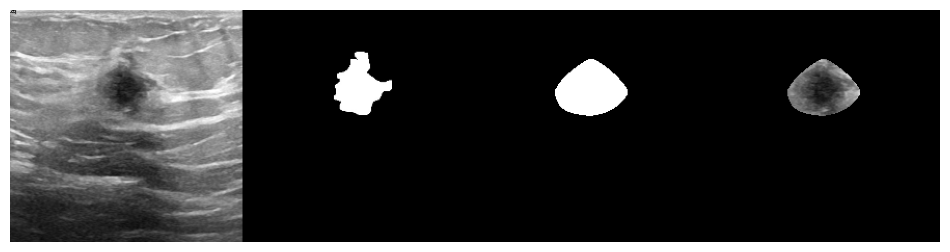

 Epoch: 13 of 100, Iter.: 16 of 16, Train Loss: 0.246410, IoU: 0.726470, Dice: 0.828030
 Epoch: 13 of 100, Iter.: 16 of 16, Valid Loss: 0.517718, IoU: 0.561082, Dice: 0.683332


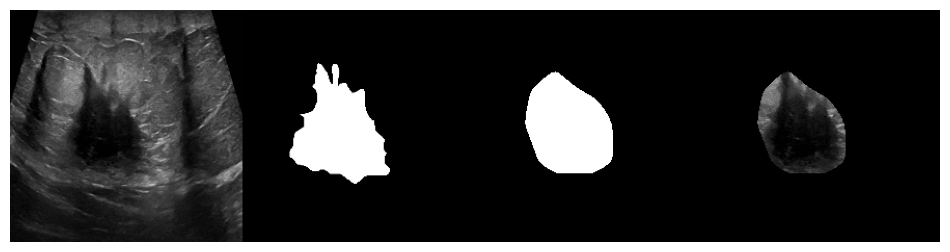

 Epoch: 14 of 100, Iter.: 16 of 16, Train Loss: 0.254865, IoU: 0.723345, Dice: 0.824030
 Epoch: 14 of 100, Iter.: 16 of 16, Valid Loss: 0.502372, IoU: 0.574283, Dice: 0.697003


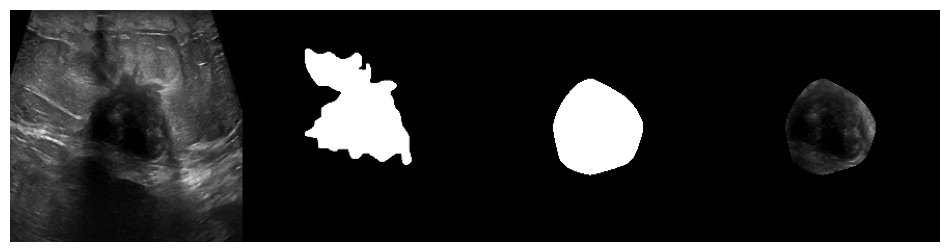

 Epoch: 15 of 100, Iter.: 16 of 16, Train Loss: 0.224254, IoU: 0.745429, Dice: 0.844124
 Epoch: 15 of 100, Iter.: 16 of 16, Valid Loss: 0.502589, IoU: 0.566942, Dice: 0.691465


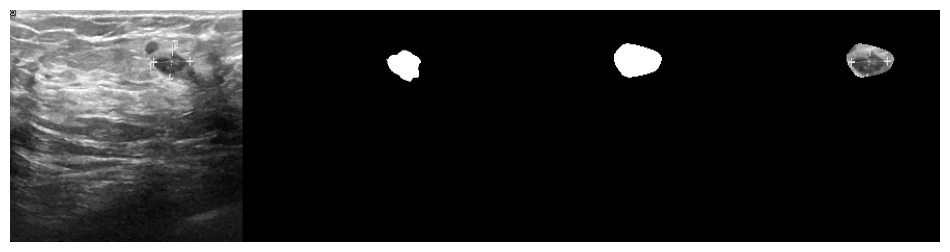

 Epoch: 16 of 100, Iter.: 16 of 16, Train Loss: 0.244281, IoU: 0.734034, Dice: 0.833804
 Epoch: 16 of 100, Iter.: 16 of 16, Valid Loss: 0.526920, IoU: 0.552683, Dice: 0.677739


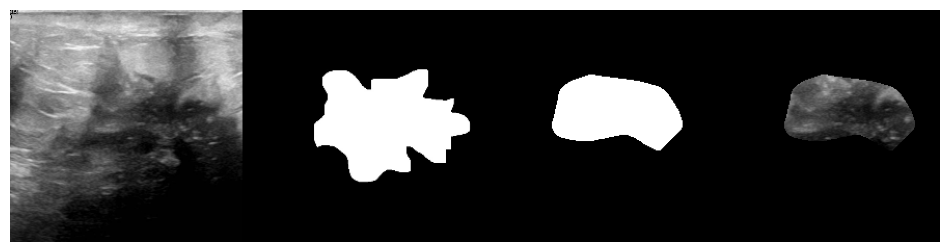

 Epoch: 17 of 100, Iter.: 16 of 16, Train Loss: 0.229210, IoU: 0.745687, Dice: 0.843846
 Epoch: 17 of 100, Iter.: 16 of 16, Valid Loss: 0.500200, IoU: 0.579126, Dice: 0.702453


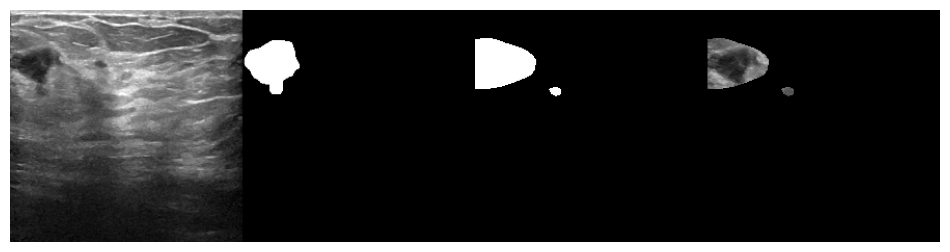

 Epoch: 18 of 100, Iter.: 16 of 16, Train Loss: 0.220239, IoU: 0.757766, Dice: 0.854780
 Epoch: 18 of 100, Iter.: 16 of 16, Valid Loss: 0.496105, IoU: 0.578352, Dice: 0.700209


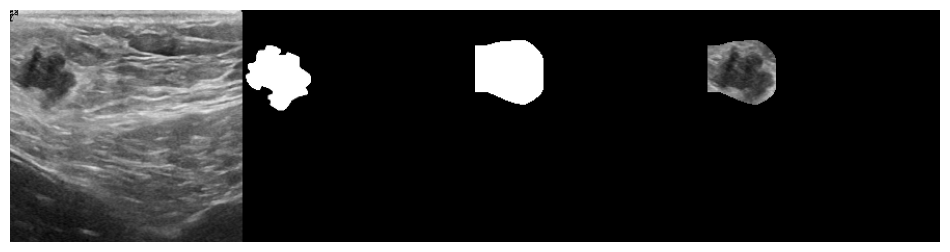

 Epoch: 19 of 100, Iter.: 16 of 16, Train Loss: 0.207108, IoU: 0.764370, Dice: 0.856115
 Epoch: 19 of 100, Iter.: 16 of 16, Valid Loss: 0.523104, IoU: 0.566666, Dice: 0.690815


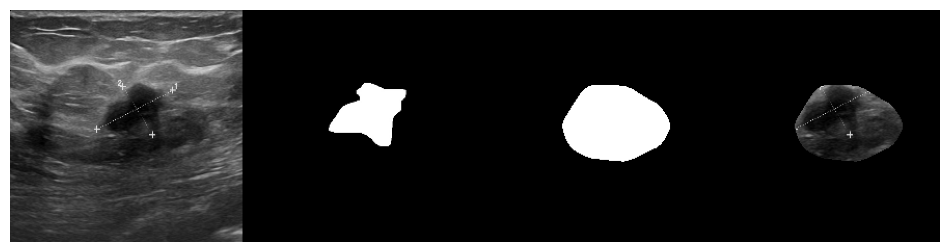

 Epoch: 20 of 100, Iter.: 16 of 16, Train Loss: 0.201637, IoU: 0.774030, Dice: 0.863124
 Epoch: 20 of 100, Iter.: 16 of 16, Valid Loss: 0.505877, IoU: 0.577644, Dice: 0.700647


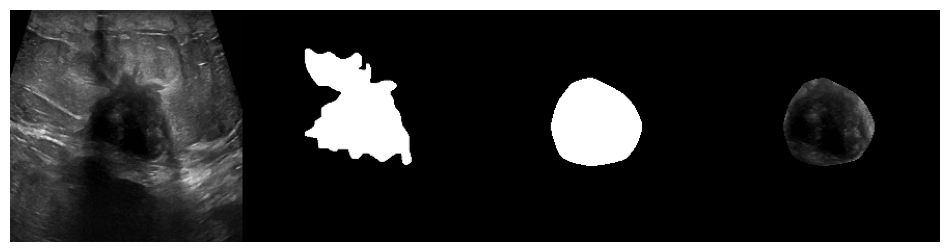

 Epoch: 21 of 100, Iter.: 16 of 16, Train Loss: 0.197489, IoU: 0.770482, Dice: 0.860028
 Epoch: 21 of 100, Iter.: 16 of 16, Valid Loss: 0.515175, IoU: 0.571876, Dice: 0.693550


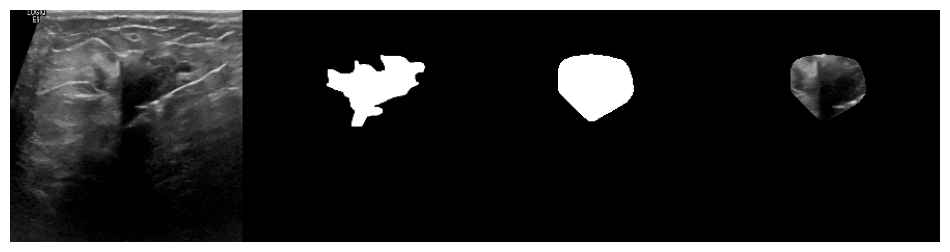

 Epoch: 22 of 100, Iter.: 16 of 16, Train Loss: 0.196602, IoU: 0.769489, Dice: 0.856508
 Epoch: 22 of 100, Iter.: 16 of 16, Valid Loss: 0.504449, IoU: 0.579708, Dice: 0.702341


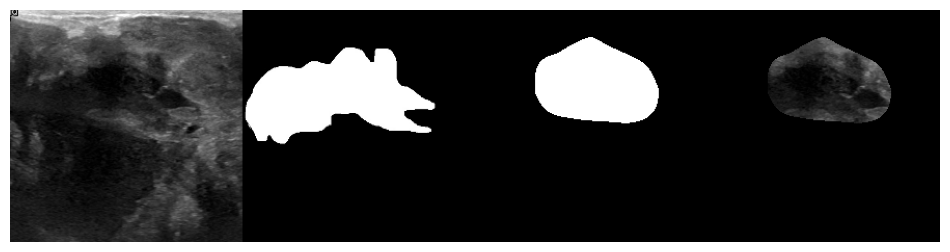

 Epoch: 23 of 100, Iter.: 16 of 16, Train Loss: 0.183534, IoU: 0.788010, Dice: 0.873148
 Epoch: 23 of 100, Iter.: 16 of 16, Valid Loss: 0.513917, IoU: 0.575761, Dice: 0.698297


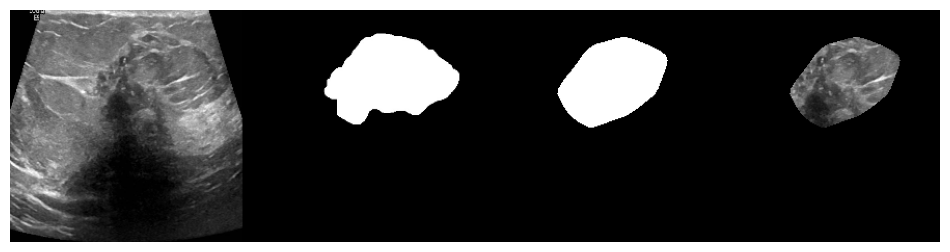

 Epoch: 24 of 100, Iter.: 16 of 16, Train Loss: 0.188823, IoU: 0.782754, Dice: 0.868603
 Epoch: 24 of 100, Iter.: 16 of 16, Valid Loss: 0.514573, IoU: 0.582184, Dice: 0.705521


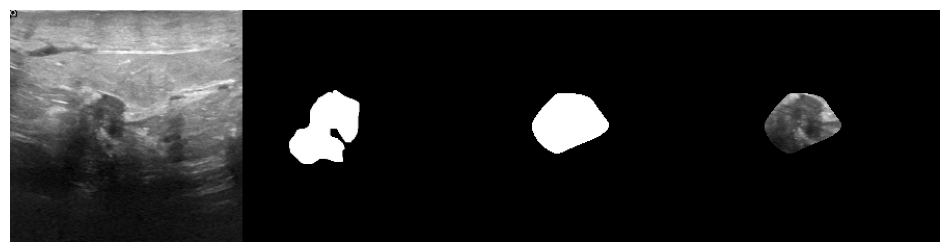

 Epoch: 25 of 100, Iter.: 16 of 16, Train Loss: 0.171079, IoU: 0.797587, Dice: 0.878508
 Epoch: 25 of 100, Iter.: 16 of 16, Valid Loss: 0.512121, IoU: 0.578589, Dice: 0.701171


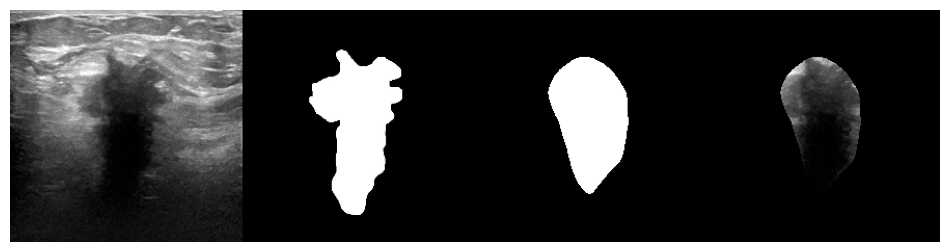

 Epoch: 26 of 100, Iter.: 16 of 16, Train Loss: 0.181965, IoU: 0.796164, Dice: 0.877304
 Epoch: 26 of 100, Iter.: 16 of 16, Valid Loss: 0.498516, IoU: 0.591570, Dice: 0.712172


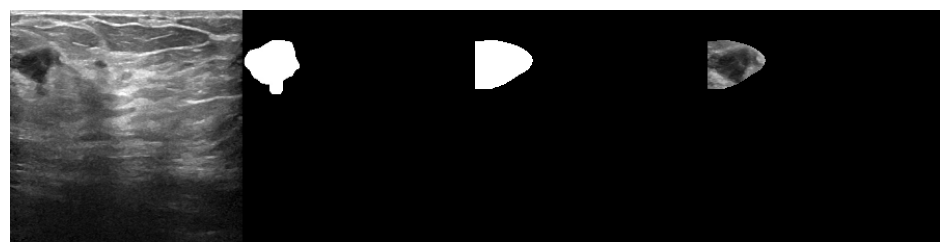

 Epoch: 27 of 100, Iter.: 16 of 16, Train Loss: 0.171257, IoU: 0.798922, Dice: 0.880547
 Epoch: 27 of 100, Iter.: 16 of 16, Valid Loss: 0.502347, IoU: 0.590754, Dice: 0.709462


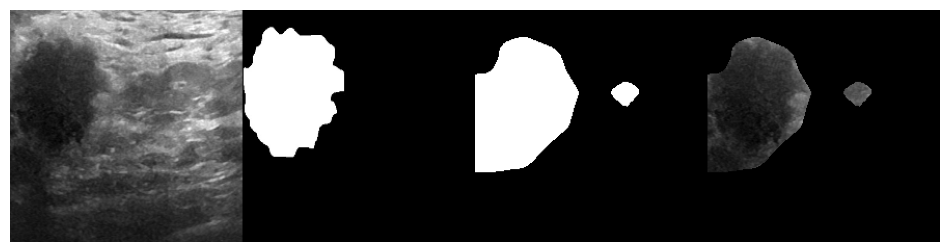

 Epoch: 28 of 100, Iter.: 16 of 16, Train Loss: 0.161328, IoU: 0.806670, Dice: 0.884831
 Epoch: 28 of 100, Iter.: 16 of 16, Valid Loss: 0.519343, IoU: 0.583419, Dice: 0.702069


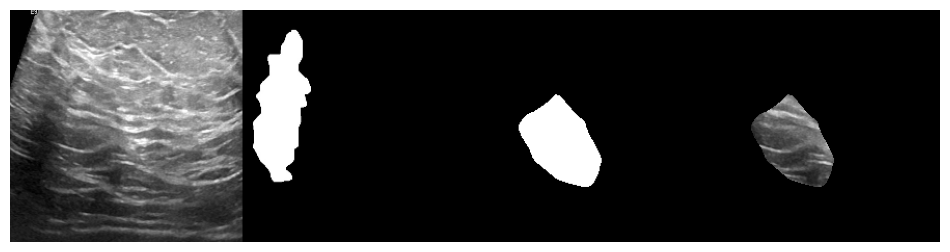

 Epoch: 29 of 100, Iter.: 16 of 16, Train Loss: 0.162459, IoU: 0.811259, Dice: 0.889162
 Epoch: 29 of 100, Iter.: 16 of 16, Valid Loss: 0.544390, IoU: 0.573170, Dice: 0.693247


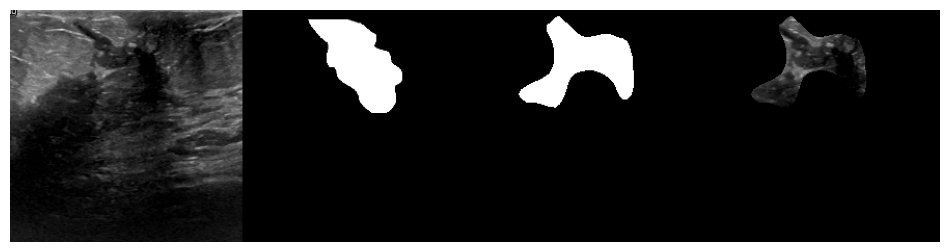

 Epoch: 30 of 100, Iter.: 16 of 16, Train Loss: 0.157047, IoU: 0.817505, Dice: 0.893492
 Epoch: 30 of 100, Iter.: 16 of 16, Valid Loss: 0.518432, IoU: 0.590776, Dice: 0.710136


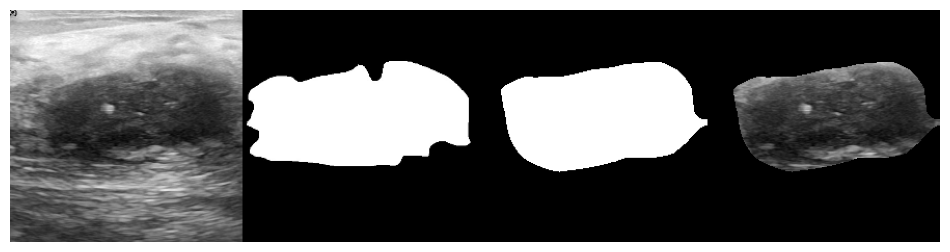

 Epoch: 31 of 100, Iter.: 16 of 16, Train Loss: 0.151822, IoU: 0.826245, Dice: 0.900454
 Epoch: 31 of 100, Iter.: 16 of 16, Valid Loss: 0.520706, IoU: 0.582121, Dice: 0.702037


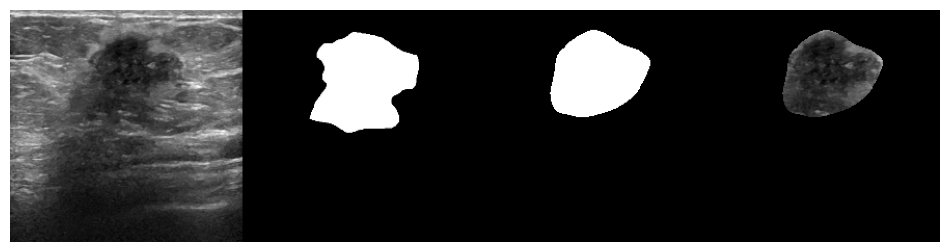

 Epoch: 32 of 100, Iter.: 16 of 16, Train Loss: 0.149706, IoU: 0.826336, Dice: 0.901363
 Epoch: 32 of 100, Iter.: 16 of 16, Valid Loss: 0.515120, IoU: 0.588692, Dice: 0.704013


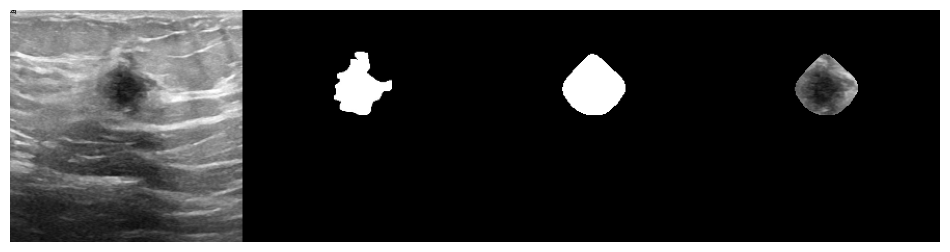

 Epoch: 33 of 100, Iter.: 16 of 16, Train Loss: 0.148465, IoU: 0.830445, Dice: 0.904143
 Epoch: 33 of 100, Iter.: 16 of 16, Valid Loss: 0.516373, IoU: 0.586773, Dice: 0.700721


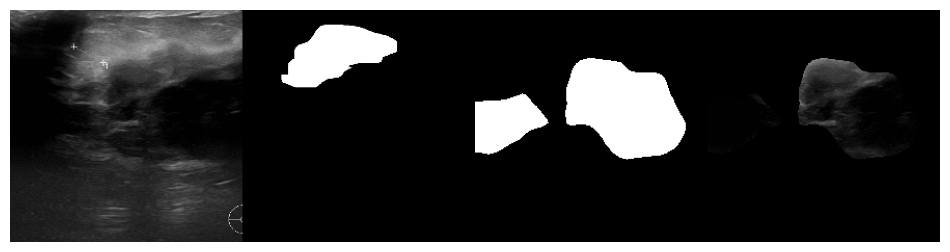

 Epoch: 34 of 100, Iter.: 16 of 16, Train Loss: 0.148290, IoU: 0.823718, Dice: 0.899731
 Epoch: 34 of 100, Iter.: 16 of 16, Valid Loss: 0.553547, IoU: 0.576699, Dice: 0.692807


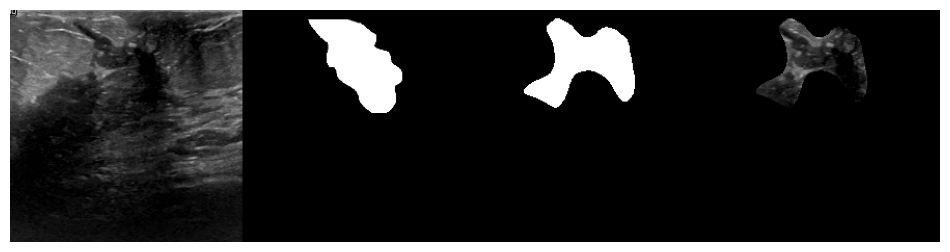

 Epoch: 35 of 100, Iter.: 16 of 16, Train Loss: 0.148020, IoU: 0.824698, Dice: 0.897267
 Epoch: 35 of 100, Iter.: 16 of 16, Valid Loss: 0.523679, IoU: 0.593089, Dice: 0.710826


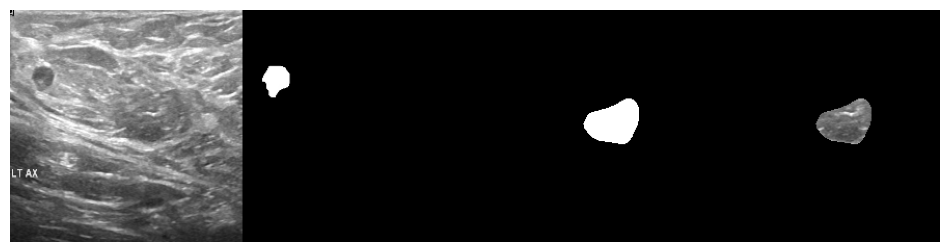

 Epoch: 36 of 100, Iter.: 16 of 16, Train Loss: 0.146134, IoU: 0.829278, Dice: 0.903379
 Epoch: 36 of 100, Iter.: 16 of 16, Valid Loss: 0.508122, IoU: 0.593987, Dice: 0.710047


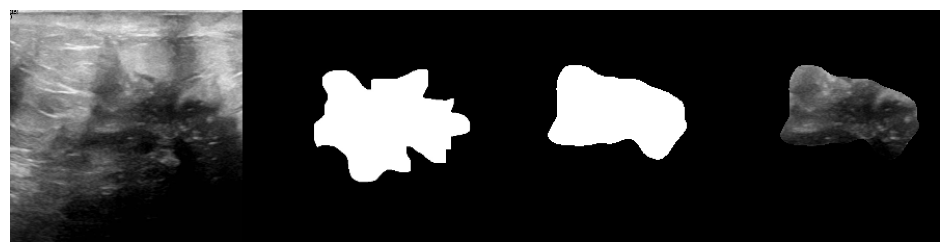

 Epoch: 37 of 100, Iter.: 16 of 16, Train Loss: 0.139849, IoU: 0.842192, Dice: 0.909590
 Epoch: 37 of 100, Iter.: 16 of 16, Valid Loss: 0.488394, IoU: 0.606850, Dice: 0.722415


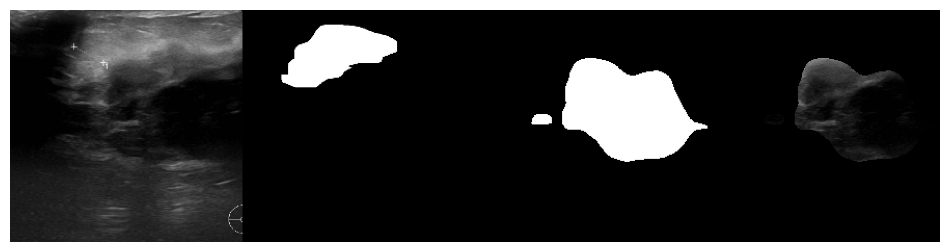

 Epoch: 38 of 100, Iter.: 16 of 16, Train Loss: 0.133834, IoU: 0.848824, Dice: 0.916679
 Epoch: 38 of 100, Iter.: 16 of 16, Valid Loss: 0.510140, IoU: 0.600232, Dice: 0.715842


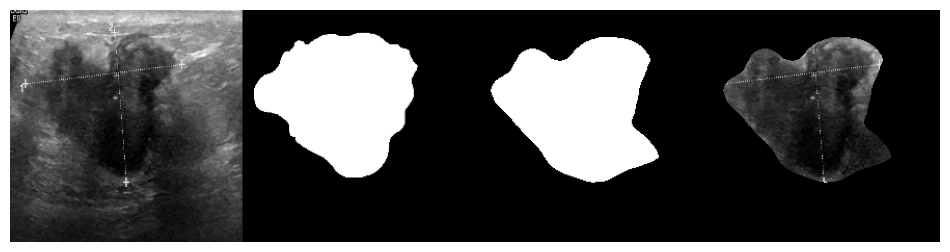

 Epoch: 39 of 100, Iter.: 16 of 16, Train Loss: 0.135242, IoU: 0.843029, Dice: 0.909867
 Epoch: 39 of 100, Iter.: 16 of 16, Valid Loss: 0.509895, IoU: 0.601535, Dice: 0.717862


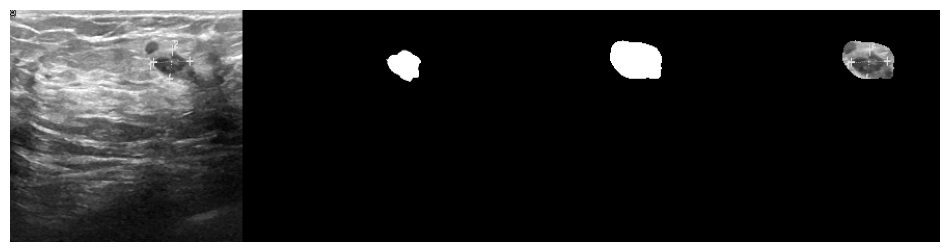

 Epoch: 40 of 100, Iter.: 16 of 16, Train Loss: 0.133812, IoU: 0.851498, Dice: 0.918041
 Epoch: 40 of 100, Iter.: 16 of 16, Valid Loss: 0.536987, IoU: 0.591556, Dice: 0.706730


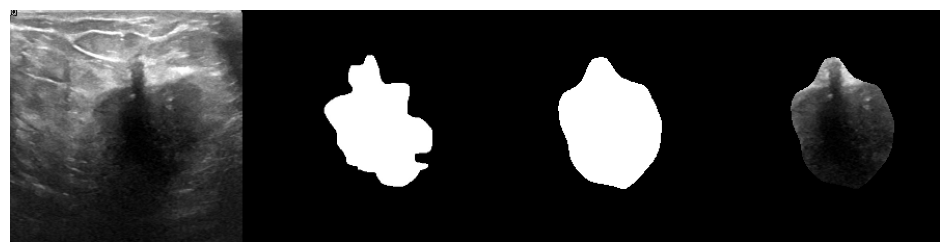

 Epoch: 41 of 100, Iter.: 16 of 16, Train Loss: 0.125709, IoU: 0.855376, Dice: 0.920432
 Epoch: 41 of 100, Iter.: 16 of 16, Valid Loss: 0.551792, IoU: 0.584004, Dice: 0.701034


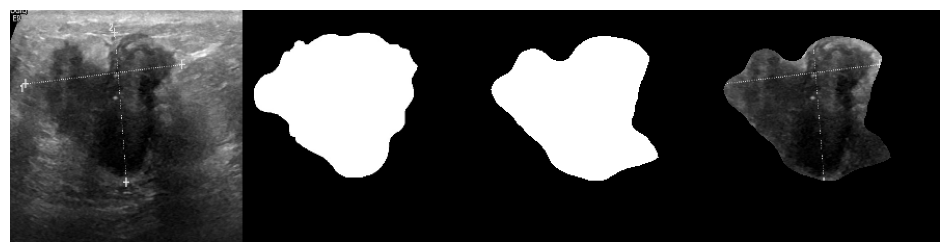

 Epoch: 42 of 100, Iter.: 16 of 16, Train Loss: 0.131802, IoU: 0.852199, Dice: 0.918152
 Epoch: 42 of 100, Iter.: 16 of 16, Valid Loss: 0.542255, IoU: 0.590245, Dice: 0.708135


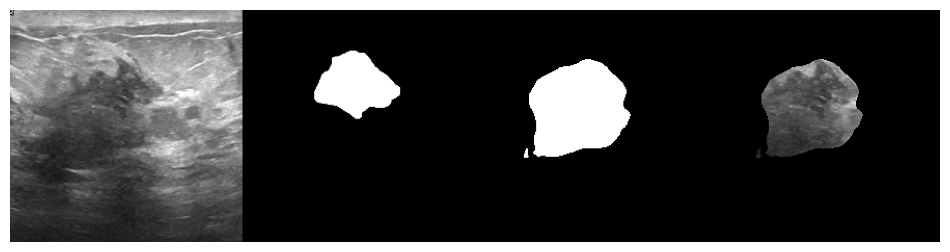

 Epoch: 43 of 100, Iter.: 16 of 16, Train Loss: 0.119537, IoU: 0.855096, Dice: 0.919244
 Epoch: 43 of 100, Iter.: 16 of 16, Valid Loss: 0.550967, IoU: 0.587622, Dice: 0.704180


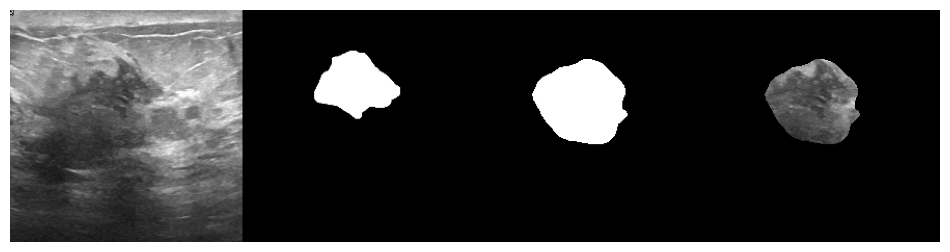

 Epoch: 44 of 100, Iter.: 16 of 16, Train Loss: 0.121504, IoU: 0.859894, Dice: 0.923012
 Epoch: 44 of 100, Iter.: 16 of 16, Valid Loss: 0.540244, IoU: 0.598122, Dice: 0.715087


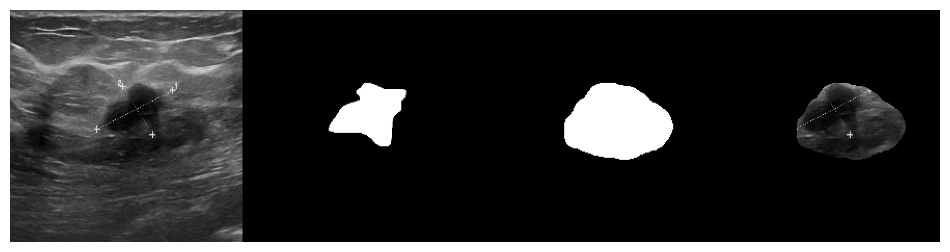

 Epoch: 45 of 100, Iter.: 16 of 16, Train Loss: 0.125128, IoU: 0.855160, Dice: 0.918437
 Epoch: 45 of 100, Iter.: 16 of 16, Valid Loss: 0.540116, IoU: 0.599698, Dice: 0.716968


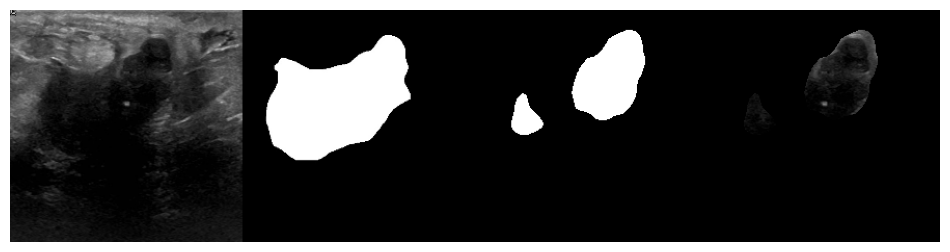

 Epoch: 46 of 100, Iter.: 16 of 16, Train Loss: 0.122416, IoU: 0.854351, Dice: 0.916493
 Epoch: 46 of 100, Iter.: 16 of 16, Valid Loss: 0.535937, IoU: 0.591820, Dice: 0.710636


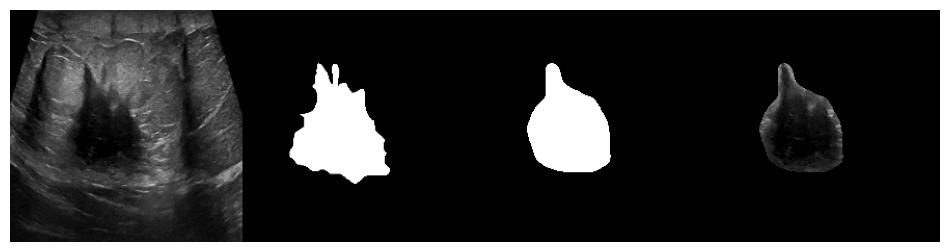

 Epoch: 47 of 100, Iter.: 16 of 16, Train Loss: 0.121386, IoU: 0.857695, Dice: 0.921788
 Epoch: 47 of 100, Iter.: 16 of 16, Valid Loss: 0.531816, IoU: 0.598400, Dice: 0.717054


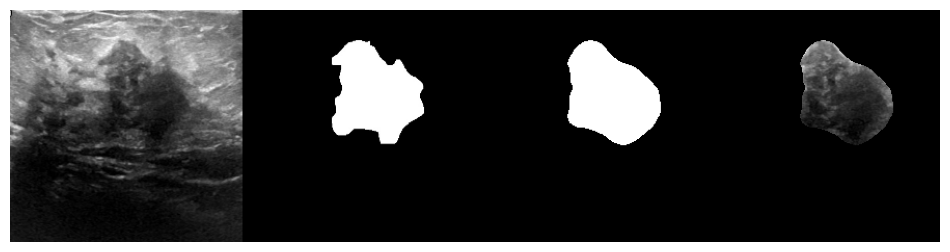

 Epoch: 48 of 100, Iter.: 16 of 16, Train Loss: 0.120534, IoU: 0.861946, Dice: 0.924013
 Epoch: 48 of 100, Iter.: 16 of 16, Valid Loss: 0.529707, IoU: 0.598638, Dice: 0.716278


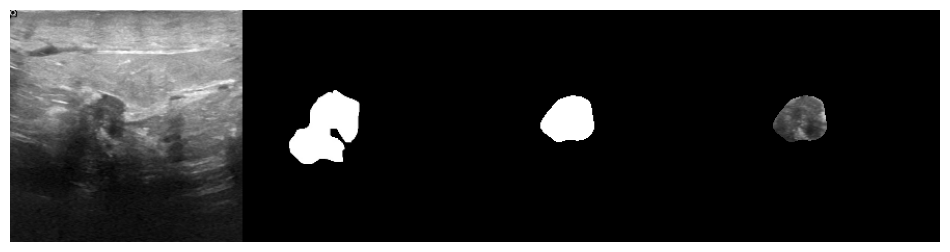

 Epoch: 49 of 100, Iter.: 16 of 16, Train Loss: 0.120327, IoU: 0.861684, Dice: 0.923517
 Epoch: 49 of 100, Iter.: 16 of 16, Valid Loss: 0.541448, IoU: 0.592299, Dice: 0.709620


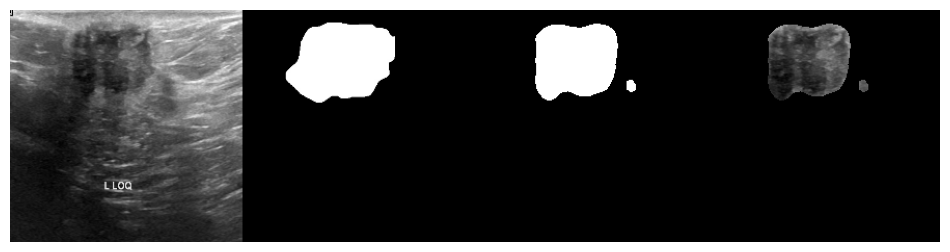

 Epoch: 50 of 100, Iter.: 16 of 16, Train Loss: 0.120622, IoU: 0.856032, Dice: 0.920082
 Epoch: 50 of 100, Iter.: 16 of 16, Valid Loss: 0.503689, IoU: 0.604750, Dice: 0.719299


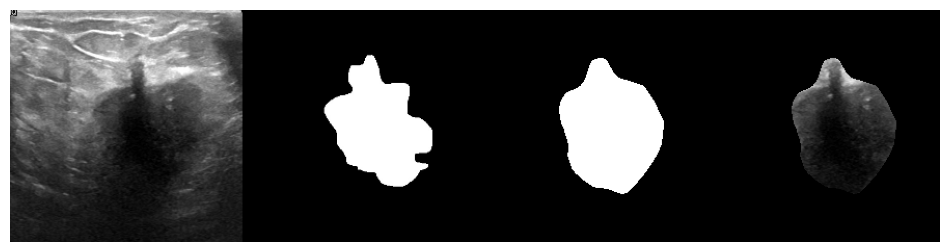

 Epoch: 51 of 100, Iter.: 16 of 16, Train Loss: 0.110532, IoU: 0.868820, Dice: 0.928367
 Epoch: 51 of 100, Iter.: 16 of 16, Valid Loss: 0.520442, IoU: 0.610912, Dice: 0.725301


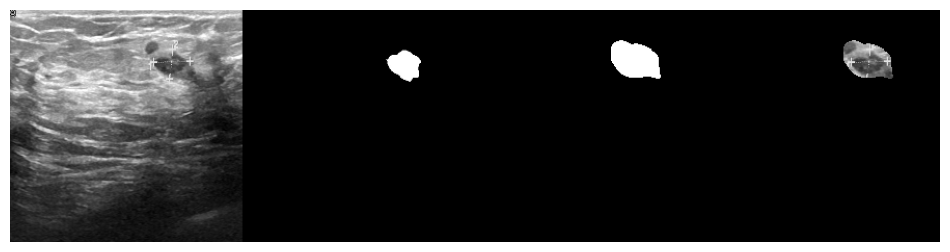

 Epoch: 52 of 100, Iter.: 16 of 16, Train Loss: 0.110886, IoU: 0.863635, Dice: 0.923644
 Epoch: 52 of 100, Iter.: 16 of 16, Valid Loss: 0.524437, IoU: 0.606547, Dice: 0.721303


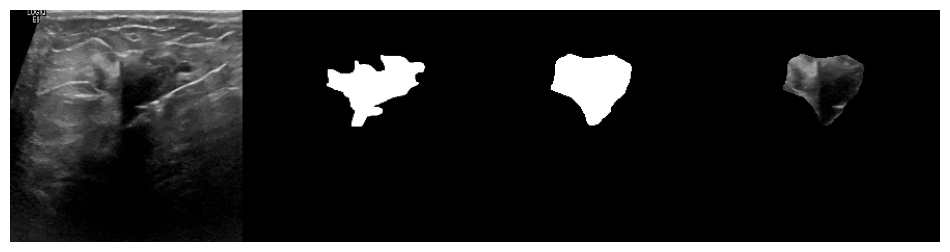

 Epoch: 53 of 100, Iter.: 16 of 16, Train Loss: 0.116987, IoU: 0.867813, Dice: 0.927268
 Epoch: 53 of 100, Iter.: 16 of 16, Valid Loss: 0.545279, IoU: 0.596626, Dice: 0.713396


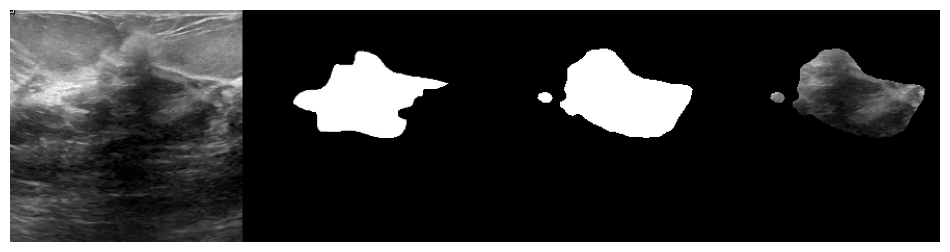

 Epoch: 54 of 100, Iter.: 16 of 16, Train Loss: 0.116714, IoU: 0.864026, Dice: 0.925107
 Epoch: 54 of 100, Iter.: 16 of 16, Valid Loss: 0.540005, IoU: 0.608120, Dice: 0.721338


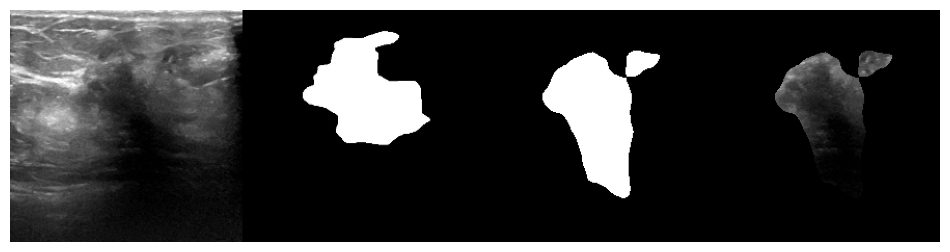

 Epoch: 55 of 100, Iter.: 16 of 16, Train Loss: 0.120252, IoU: 0.863573, Dice: 0.925077
 Epoch: 55 of 100, Iter.: 16 of 16, Valid Loss: 0.531953, IoU: 0.606663, Dice: 0.721601


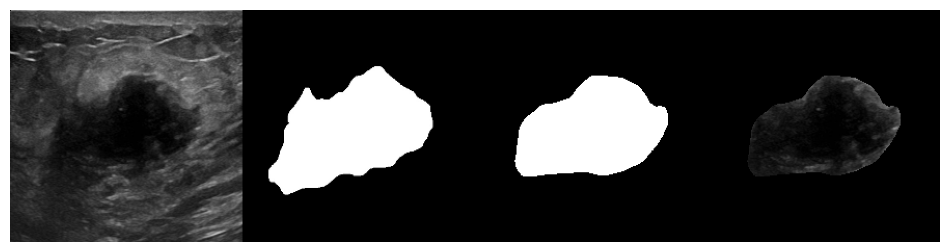

 Epoch: 56 of 100, Iter.: 16 of 16, Train Loss: 0.112589, IoU: 0.870669, Dice: 0.929843
 Epoch: 56 of 100, Iter.: 16 of 16, Valid Loss: 0.543614, IoU: 0.601720, Dice: 0.716208


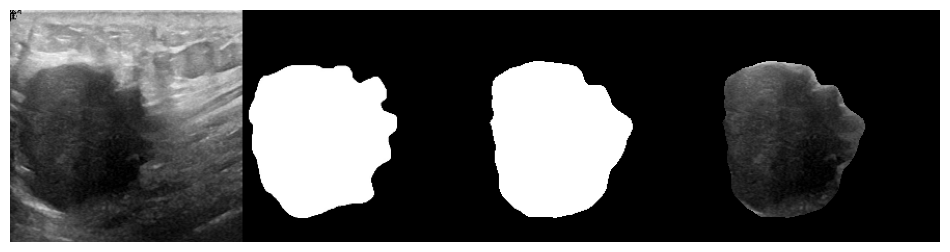

 Epoch: 57 of 100, Iter.: 16 of 16, Train Loss: 0.108862, IoU: 0.876587, Dice: 0.933072
 Epoch: 57 of 100, Iter.: 16 of 16, Valid Loss: 0.568118, IoU: 0.595068, Dice: 0.711244


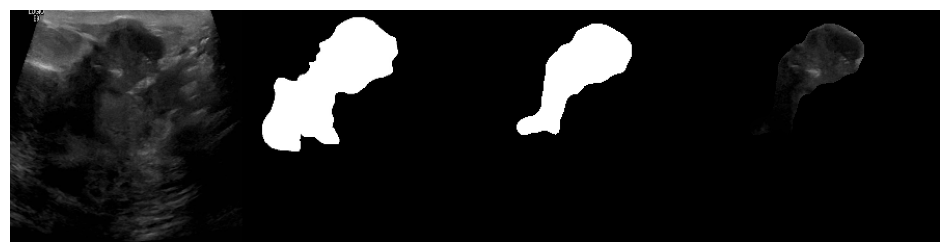

 Epoch: 58 of 100, Iter.: 16 of 16, Train Loss: 0.105172, IoU: 0.877668, Dice: 0.933664
 Epoch: 58 of 100, Iter.: 16 of 16, Valid Loss: 0.545461, IoU: 0.605603, Dice: 0.718714


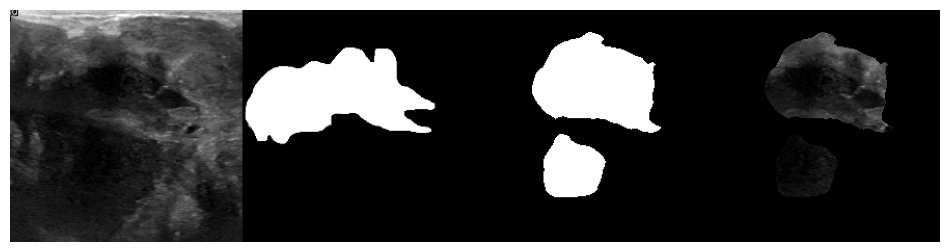

 Epoch: 59 of 100, Iter.: 16 of 16, Train Loss: 0.112010, IoU: 0.875279, Dice: 0.932266
 Epoch: 59 of 100, Iter.: 16 of 16, Valid Loss: 0.547016, IoU: 0.602392, Dice: 0.718197


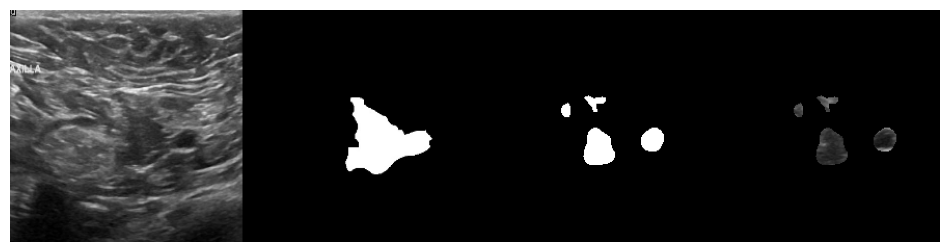

 Epoch: 60 of 100, Iter.: 16 of 16, Train Loss: 0.112075, IoU: 0.872362, Dice: 0.930821
 Epoch: 60 of 100, Iter.: 16 of 16, Valid Loss: 0.571185, IoU: 0.598489, Dice: 0.715278


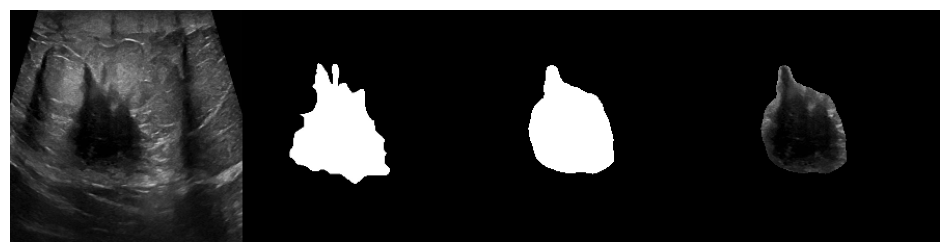

 Epoch: 61 of 100, Iter.: 16 of 16, Train Loss: 0.107094, IoU: 0.876187, Dice: 0.932402
 Epoch: 61 of 100, Iter.: 16 of 16, Valid Loss: 0.569022, IoU: 0.598273, Dice: 0.715744


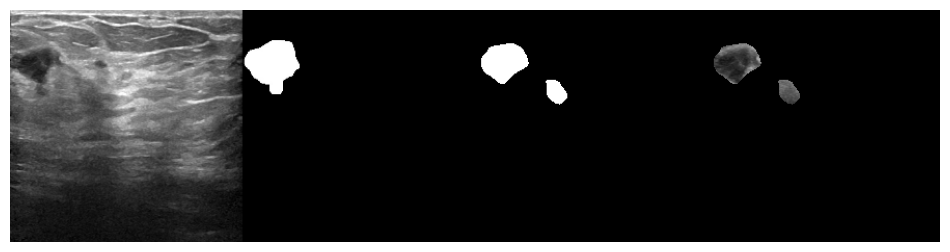

 Epoch: 62 of 100, Iter.: 16 of 16, Train Loss: 0.102254, IoU: 0.878956, Dice: 0.934473
 Epoch: 62 of 100, Iter.: 16 of 16, Valid Loss: 0.546481, IoU: 0.602311, Dice: 0.719658


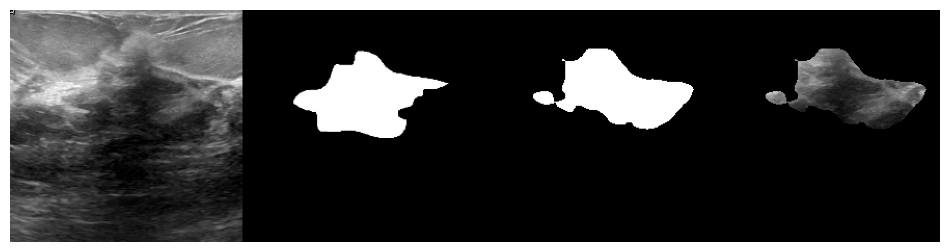

 Epoch: 63 of 100, Iter.: 16 of 16, Train Loss: 0.103167, IoU: 0.879985, Dice: 0.935136
 Epoch: 63 of 100, Iter.: 16 of 16, Valid Loss: 0.555627, IoU: 0.606058, Dice: 0.724084


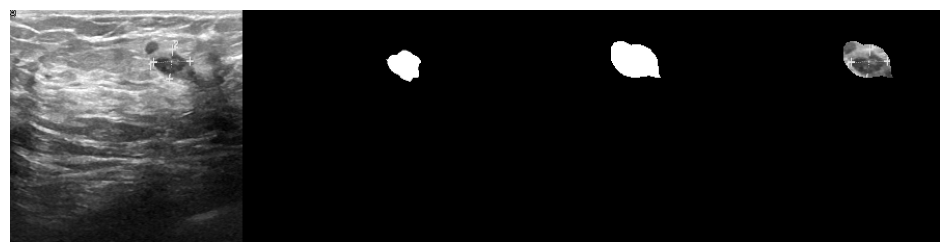

 Epoch: 64 of 100, Iter.: 16 of 16, Train Loss: 0.094373, IoU: 0.884804, Dice: 0.937539
 Epoch: 64 of 100, Iter.: 16 of 16, Valid Loss: 0.543421, IoU: 0.611065, Dice: 0.725717


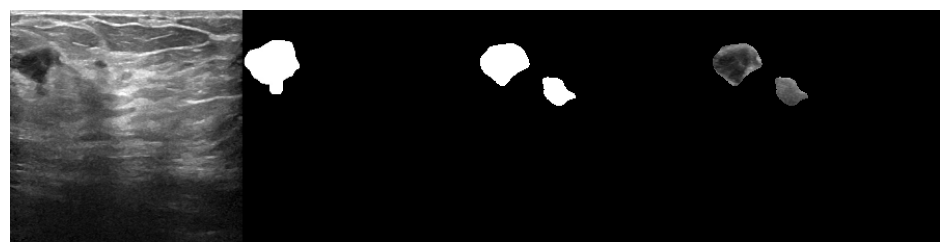

 Epoch: 65 of 100, Iter.: 16 of 16, Train Loss: 0.096166, IoU: 0.885786, Dice: 0.937916
 Epoch: 65 of 100, Iter.: 16 of 16, Valid Loss: 0.552619, IoU: 0.605432, Dice: 0.721680


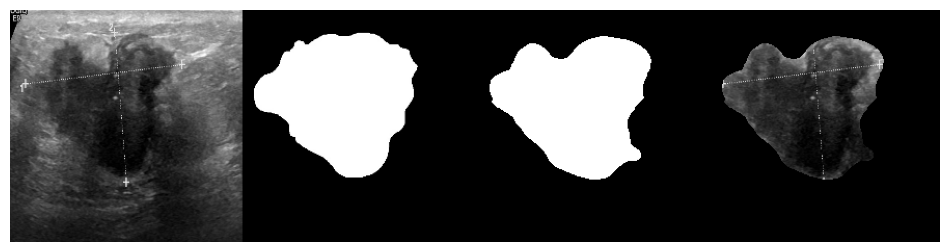

 Epoch: 66 of 100, Iter.: 16 of 16, Train Loss: 0.092122, IoU: 0.891816, Dice: 0.942010
 Epoch: 66 of 100, Iter.: 16 of 16, Valid Loss: 0.559627, IoU: 0.605875, Dice: 0.722228


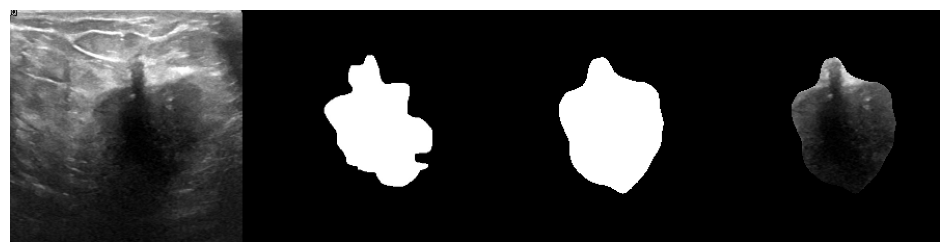

 Epoch: 67 of 100, Iter.: 16 of 16, Train Loss: 0.095201, IoU: 0.889878, Dice: 0.940863
 Epoch: 67 of 100, Iter.: 16 of 16, Valid Loss: 0.574562, IoU: 0.601935, Dice: 0.717792


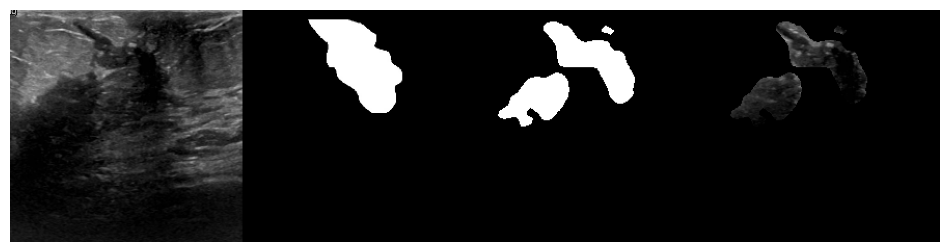

 Epoch: 68 of 100, Iter.: 16 of 16, Train Loss: 0.098637, IoU: 0.886073, Dice: 0.937937
 Epoch: 68 of 100, Iter.: 16 of 16, Valid Loss: 0.564569, IoU: 0.602230, Dice: 0.718394


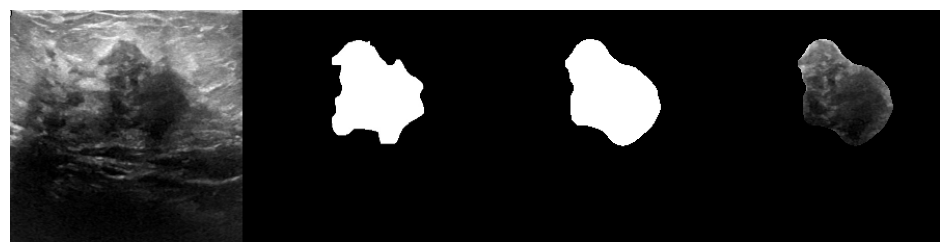

 Epoch: 69 of 100, Iter.: 16 of 16, Train Loss: 0.089858, IoU: 0.894417, Dice: 0.943547
 Epoch: 69 of 100, Iter.: 16 of 16, Valid Loss: 0.573689, IoU: 0.602920, Dice: 0.718746


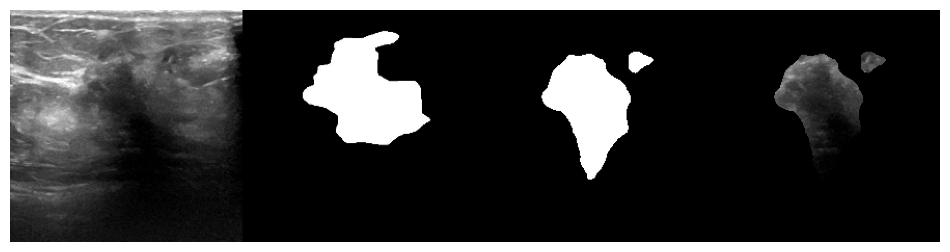

 Epoch: 70 of 100, Iter.: 16 of 16, Train Loss: 0.090795, IoU: 0.892687, Dice: 0.942496
 Epoch: 70 of 100, Iter.: 16 of 16, Valid Loss: 0.590137, IoU: 0.597103, Dice: 0.715142


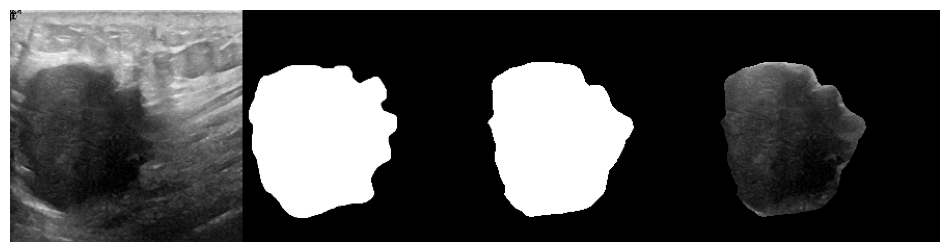

 Epoch: 71 of 100, Iter.: 16 of 16, Train Loss: 0.089048, IoU: 0.894377, Dice: 0.943284
 Epoch: 71 of 100, Iter.: 16 of 16, Valid Loss: 0.587914, IoU: 0.604262, Dice: 0.720314


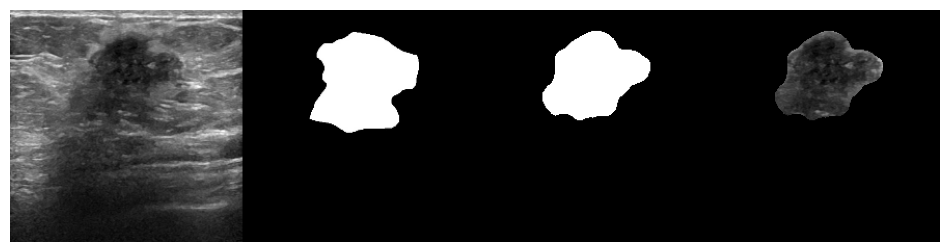

 Epoch: 72 of 100, Iter.: 16 of 16, Train Loss: 0.083182, IoU: 0.898414, Dice: 0.945827
 Epoch: 72 of 100, Iter.: 16 of 16, Valid Loss: 0.597131, IoU: 0.603255, Dice: 0.718251


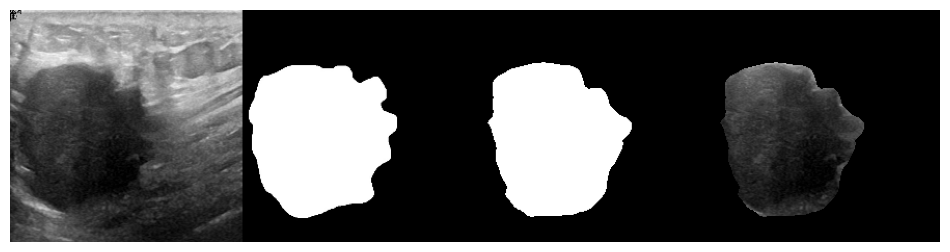

 Epoch: 73 of 100, Iter.: 16 of 16, Train Loss: 0.089515, IoU: 0.892430, Dice: 0.941758
 Epoch: 73 of 100, Iter.: 16 of 16, Valid Loss: 0.599236, IoU: 0.594376, Dice: 0.711712


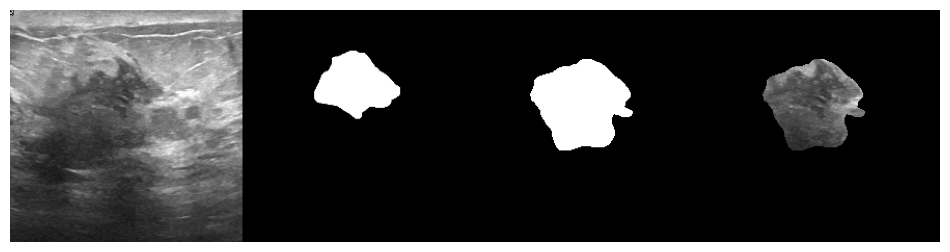

 Epoch: 74 of 100, Iter.: 16 of 16, Train Loss: 0.089355, IoU: 0.896488, Dice: 0.944615
 Epoch: 74 of 100, Iter.: 16 of 16, Valid Loss: 0.607991, IoU: 0.600483, Dice: 0.716775


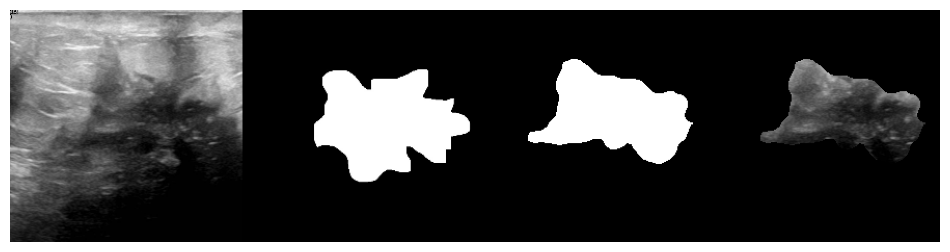

 Epoch: 75 of 100, Iter.: 16 of 16, Train Loss: 0.090218, IoU: 0.891336, Dice: 0.941349
 Epoch: 75 of 100, Iter.: 16 of 16, Valid Loss: 0.600199, IoU: 0.605813, Dice: 0.723011


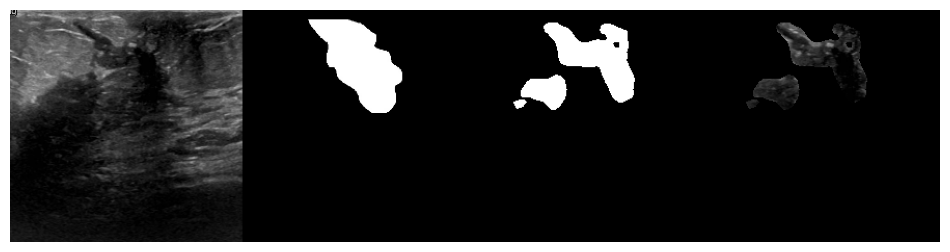

 Epoch: 76 of 100, Iter.: 16 of 16, Train Loss: 0.092548, IoU: 0.894098, Dice: 0.943516
 Epoch: 76 of 100, Iter.: 16 of 16, Valid Loss: 0.610958, IoU: 0.595136, Dice: 0.715269


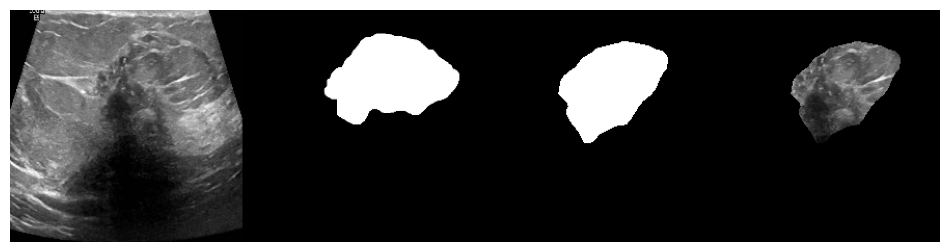

 Epoch: 77 of 100, Iter.: 16 of 16, Train Loss: 0.088301, IoU: 0.895461, Dice: 0.944102
 Epoch: 77 of 100, Iter.: 16 of 16, Valid Loss: 0.605635, IoU: 0.593820, Dice: 0.713197


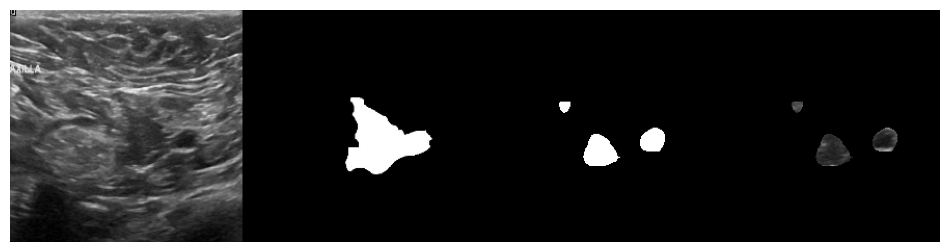

 Epoch: 78 of 100, Iter.: 16 of 16, Train Loss: 0.086755, IoU: 0.892379, Dice: 0.941117
 Epoch: 78 of 100, Iter.: 16 of 16, Valid Loss: 0.600977, IoU: 0.598372, Dice: 0.716578


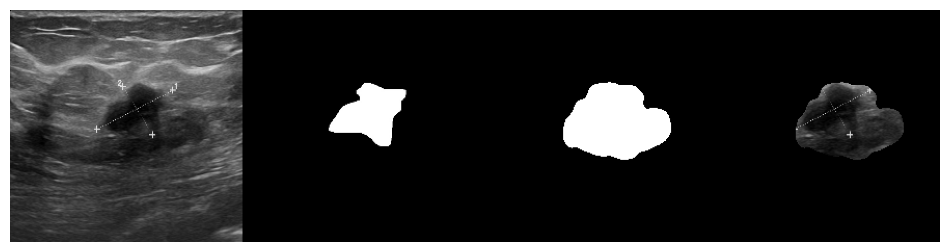

 Epoch: 79 of 100, Iter.: 16 of 16, Train Loss: 0.088963, IoU: 0.897168, Dice: 0.945035
 Epoch: 79 of 100, Iter.: 16 of 16, Valid Loss: 0.626180, IoU: 0.591935, Dice: 0.708590


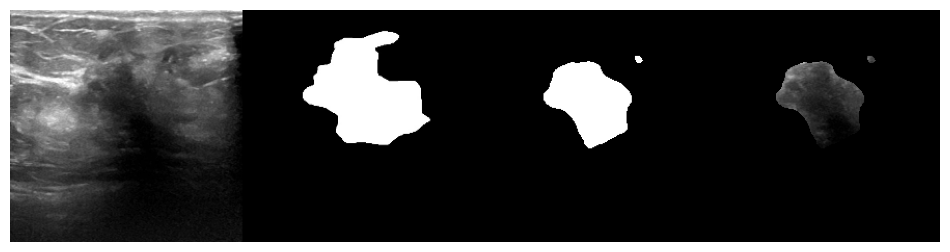

 Epoch: 80 of 100, Iter.: 16 of 16, Train Loss: 0.086468, IoU: 0.894998, Dice: 0.943181
 Epoch: 80 of 100, Iter.: 16 of 16, Valid Loss: 0.598760, IoU: 0.606887, Dice: 0.722851


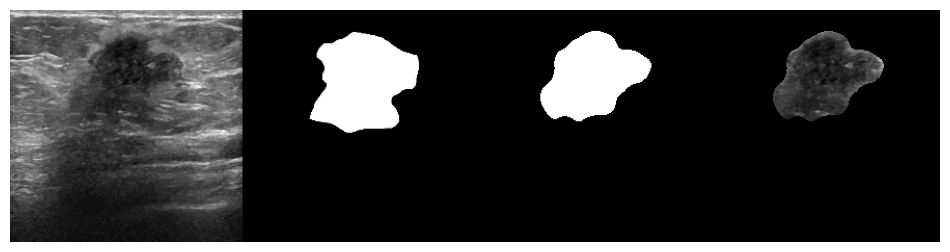

 Epoch: 81 of 100, Iter.: 16 of 16, Train Loss: 0.085790, IoU: 0.894997, Dice: 0.941297
 Epoch: 81 of 100, Iter.: 16 of 16, Valid Loss: 0.602924, IoU: 0.607151, Dice: 0.722207


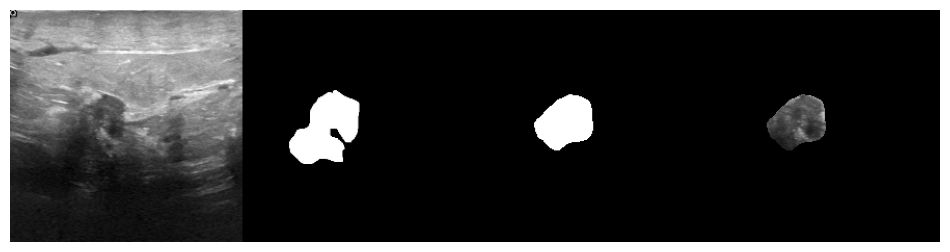

 Epoch: 82 of 100, Iter.: 16 of 16, Train Loss: 0.085493, IoU: 0.894339, Dice: 0.943104
 Epoch: 82 of 100, Iter.: 16 of 16, Valid Loss: 0.633641, IoU: 0.599855, Dice: 0.718657


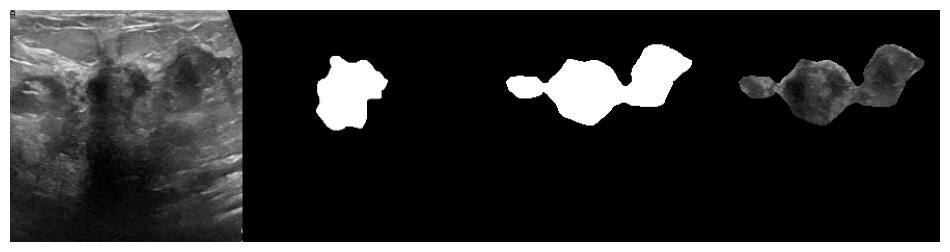

 Epoch: 83 of 100, Iter.: 16 of 16, Train Loss: 0.083097, IoU: 0.902369, Dice: 0.948033
 Epoch: 83 of 100, Iter.: 16 of 16, Valid Loss: 0.628206, IoU: 0.612158, Dice: 0.726915


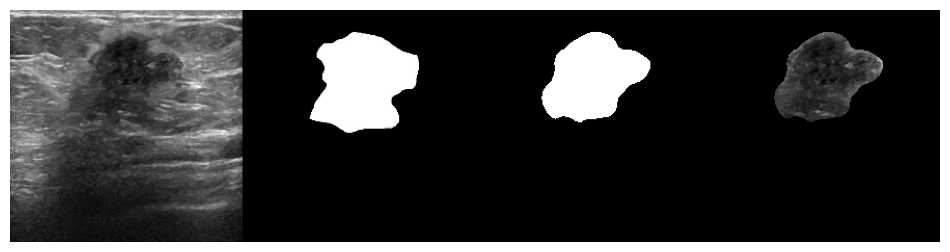

 Epoch: 84 of 100, Iter.: 16 of 16, Train Loss: 0.087439, IoU: 0.895028, Dice: 0.942766
 Epoch: 84 of 100, Iter.: 16 of 16, Valid Loss: 0.629585, IoU: 0.605655, Dice: 0.721180


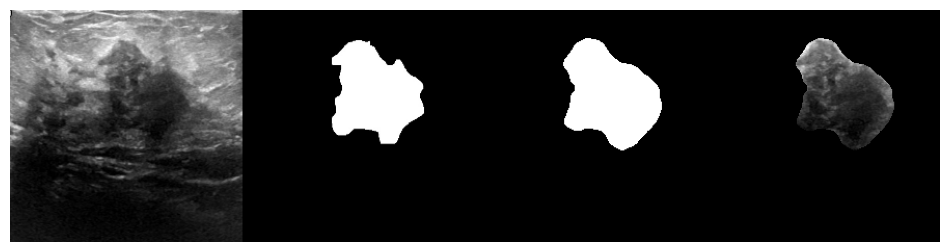

 Epoch: 85 of 100, Iter.: 16 of 16, Train Loss: 0.086630, IoU: 0.893025, Dice: 0.942270
 Epoch: 85 of 100, Iter.: 16 of 16, Valid Loss: 0.607327, IoU: 0.601982, Dice: 0.720350


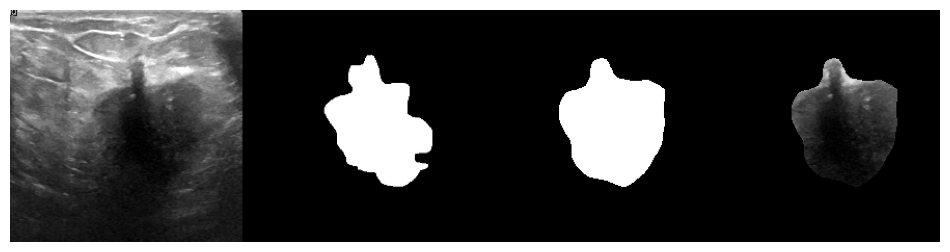

 Epoch: 86 of 100, Iter.: 16 of 16, Train Loss: 0.082303, IoU: 0.901393, Dice: 0.947551
 Epoch: 86 of 100, Iter.: 16 of 16, Valid Loss: 0.616907, IoU: 0.603442, Dice: 0.719934


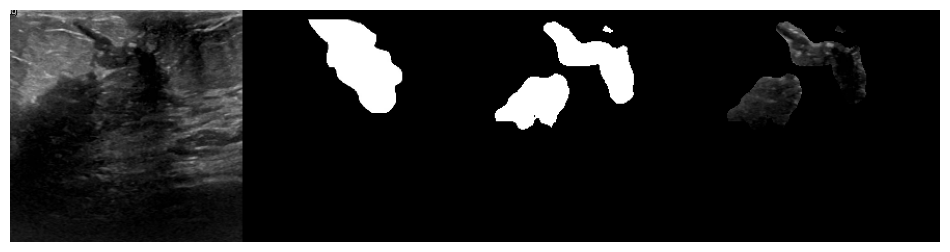

 Epoch: 87 of 100, Iter.: 16 of 16, Train Loss: 0.083973, IoU: 0.898819, Dice: 0.945774
 Epoch: 87 of 100, Iter.: 16 of 16, Valid Loss: 0.618213, IoU: 0.595317, Dice: 0.713792


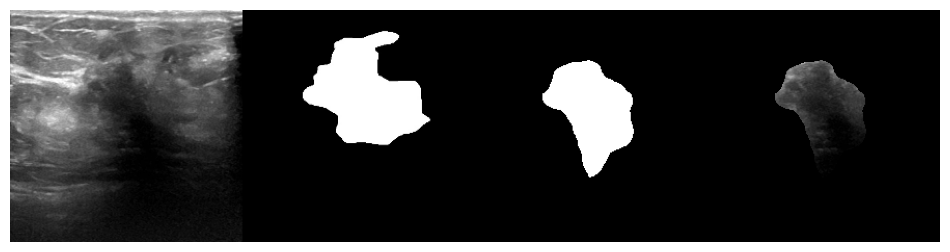

 Epoch: 88 of 100, Iter.: 16 of 16, Train Loss: 0.079106, IoU: 0.908759, Dice: 0.951651
 Epoch: 88 of 100, Iter.: 16 of 16, Valid Loss: 0.652349, IoU: 0.596421, Dice: 0.714888


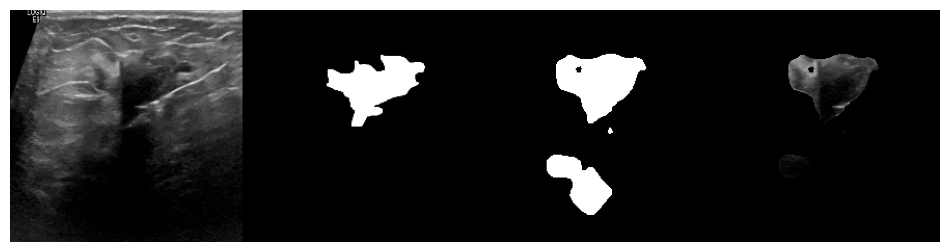

 Epoch: 89 of 100, Iter.: 16 of 16, Train Loss: 0.076650, IoU: 0.906381, Dice: 0.950359
 Epoch: 89 of 100, Iter.: 16 of 16, Valid Loss: 0.633570, IoU: 0.605077, Dice: 0.721722


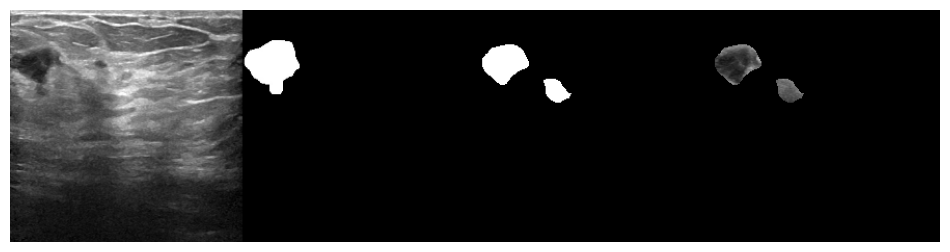

 Epoch: 90 of 100, Iter.: 16 of 16, Train Loss: 0.080575, IoU: 0.901914, Dice: 0.947588
 Epoch: 90 of 100, Iter.: 16 of 16, Valid Loss: 0.628581, IoU: 0.594480, Dice: 0.714127


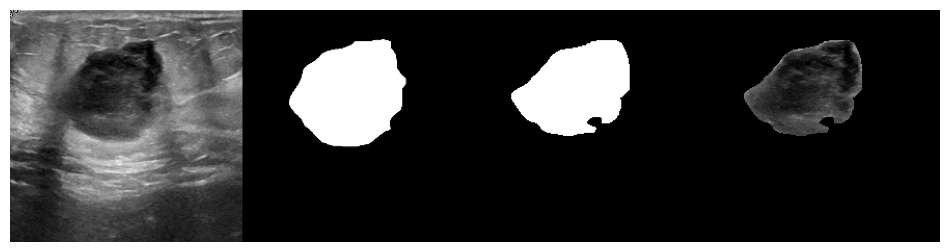

 Epoch: 91 of 100, Iter.: 16 of 16, Train Loss: 0.082350, IoU: 0.901079, Dice: 0.947163
 Epoch: 91 of 100, Iter.: 16 of 16, Valid Loss: 0.630288, IoU: 0.590703, Dice: 0.709724


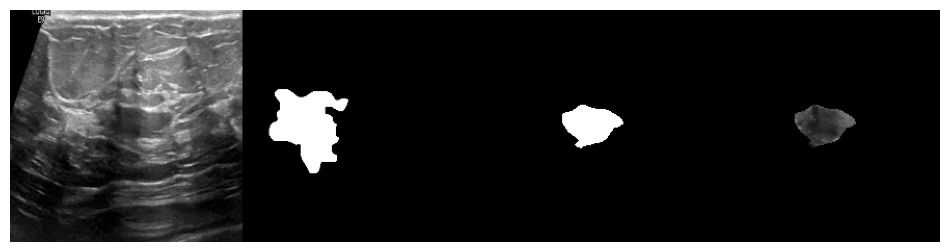

 Epoch: 92 of 100, Iter.: 16 of 16, Train Loss: 0.076284, IoU: 0.908094, Dice: 0.951188
 Epoch: 92 of 100, Iter.: 16 of 16, Valid Loss: 0.641479, IoU: 0.596809, Dice: 0.715660


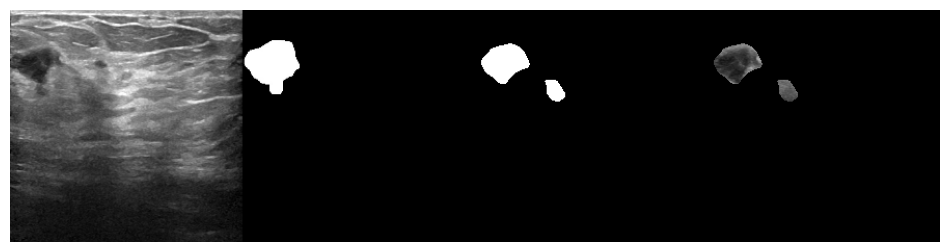

 Epoch: 93 of 100, Iter.: 16 of 16, Train Loss: 0.072897, IoU: 0.909681, Dice: 0.951616
 Epoch: 93 of 100, Iter.: 16 of 16, Valid Loss: 0.652940, IoU: 0.599095, Dice: 0.716631


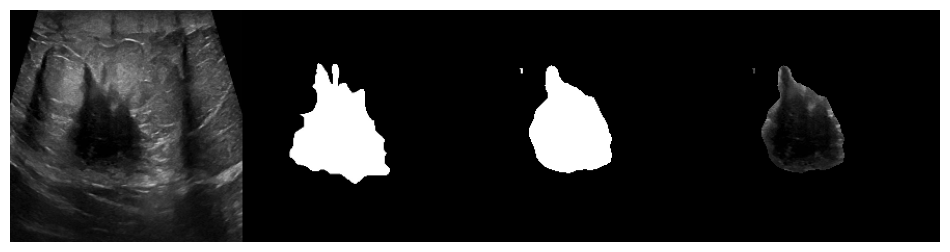

 Epoch: 94 of 100, Iter.: 16 of 16, Train Loss: 0.072535, IoU: 0.910417, Dice: 0.952435
 Epoch: 94 of 100, Iter.: 16 of 16, Valid Loss: 0.665031, IoU: 0.593817, Dice: 0.711566


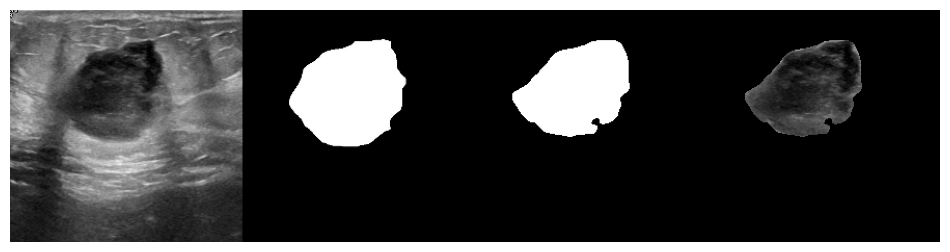

 Epoch: 95 of 100, Iter.: 16 of 16, Train Loss: 0.072064, IoU: 0.913174, Dice: 0.954089
 Epoch: 95 of 100, Iter.: 16 of 16, Valid Loss: 0.618944, IoU: 0.603215, Dice: 0.719611


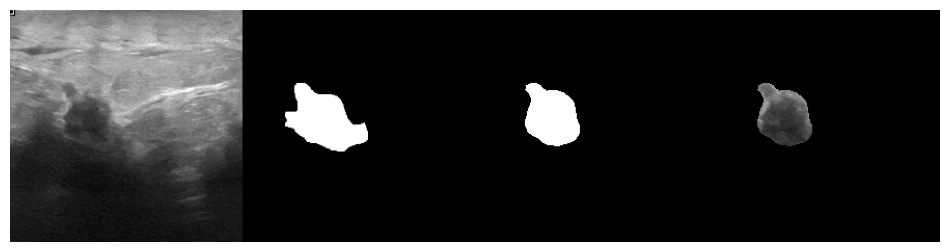

 Epoch: 96 of 100, Iter.: 16 of 16, Train Loss: 0.065561, IoU: 0.920215, Dice: 0.958050
 Epoch: 96 of 100, Iter.: 16 of 16, Valid Loss: 0.662253, IoU: 0.596930, Dice: 0.714335


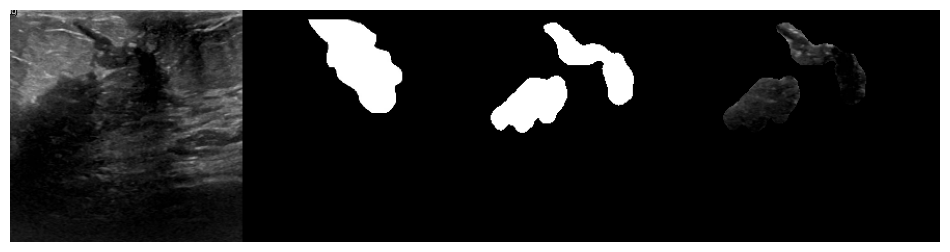

 Epoch: 97 of 100, Iter.: 16 of 16, Train Loss: 0.080702, IoU: 0.900974, Dice: 0.946430
 Epoch: 97 of 100, Iter.: 16 of 16, Valid Loss: 0.621940, IoU: 0.599700, Dice: 0.717275


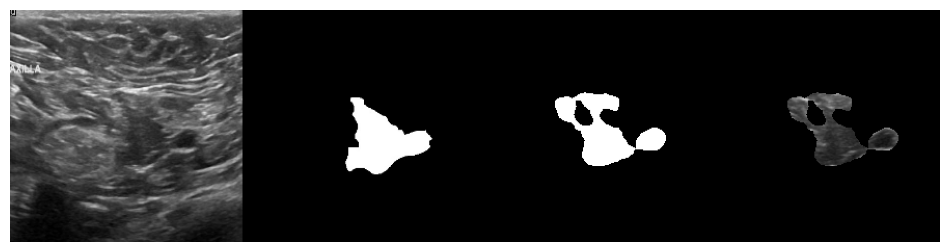

 Epoch: 98 of 100, Iter.: 16 of 16, Train Loss: 0.080871, IoU: 0.903803, Dice: 0.948730
 Epoch: 98 of 100, Iter.: 16 of 16, Valid Loss: 0.656398, IoU: 0.600324, Dice: 0.717614


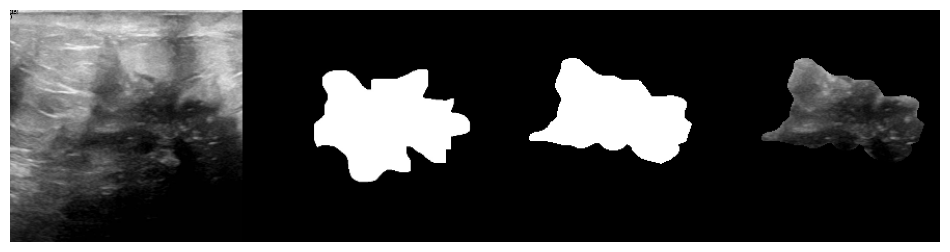

 Epoch: 99 of 100, Iter.: 16 of 16, Train Loss: 0.070355, IoU: 0.912881, Dice: 0.953975
 Epoch: 99 of 100, Iter.: 16 of 16, Valid Loss: 0.630774, IoU: 0.605641, Dice: 0.721460


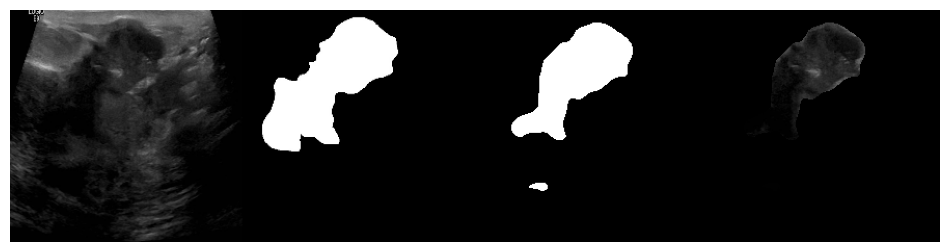

 Epoch: 100 of 100, Iter.: 16 of 16, Train Loss: 0.075812, IoU: 0.907732, Dice: 0.950758
 Epoch: 100 of 100, Iter.: 16 of 16, Valid Loss: 0.640218, IoU: 0.601022, Dice: 0.718665


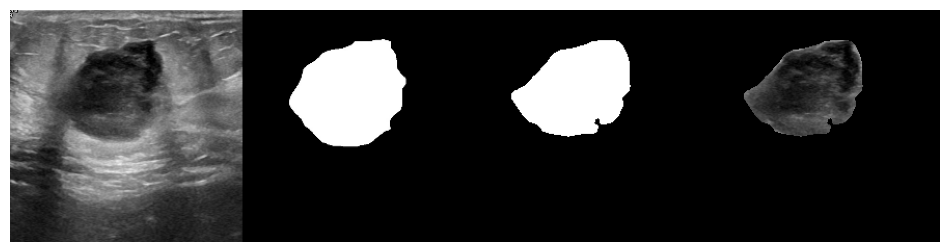

CPU times: user 7min 59s, sys: 8min 1s, total: 16min
Wall time: 8min 55s


In [12]:
%%time
from ploting import plot_model_prediction

train_losses, val_losses = [], []
train_ious, val_ious = [], []
train_dices, val_dices = [], []
best_iou, best_dice, best_loss = 0, 0, np.inf
best_epoch_dice = -1
state = {}
lst_epoch_metric = []

start_time = time.time()
for epoch in range(1, epochs+1):
    running_loss, running_iou, running_dice = 0, 0, 0

    # Train
    model.train()
    for i, (imgs, masks) in enumerate(dataloader_train):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        
        optimizer.zero_grad()
        loss = criterion(prediction, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        running_iou += iou_pytorch_eval(prediction, masks)
        running_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, IoU:  {:.6f},  Dice:  {:.6f}".format(epoch, epochs, i, len(dataloader_train), running_loss/(i+1), running_iou/(i+1), running_dice/(i+1)), end="")
        
    # Validate
    model.eval()
    val_loss, val_iou, val_dice = 0, 0, 0
    for i, (imgs, masks) in enumerate(dataloader_val):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        loss = criterion(prediction, masks)
        val_loss += loss.item()
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, Val. Loss: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_loss/len(dataloader_train), val_loss/(i+1)), end="")
        
        val_iou += iou_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, IoU: {:.6f}, Val. IoU: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_iou/len(dataloader_train), val_iou/(i+1)), end="")

        val_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Dice: {:.6f}, Val. Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_dice/len(dataloader_train), val_dice/(i+1)), end="")
    
    
    # compute overall epoch losses
    epoch_train_loss = running_loss/len(dataloader_train)
    train_losses.append(epoch_train_loss)
    epoch_val_loss = val_loss/len(dataloader_val)
    val_losses.append(epoch_val_loss)

    # compute overall epoch iou-s
    epoch_train_iou = (running_iou/len(dataloader_train)).item()
    train_ious.append(epoch_train_iou)
    epoch_val_iou = (val_iou/len(dataloader_val)).item()
    val_ious.append(epoch_val_iou)
    
    # compute overall epoch dice
    epoch_train_dice = (running_dice/len(dataloader_train)).item()
    train_dices.append(epoch_train_dice)
    epoch_val_dice = (val_dice/len(dataloader_val)).item()
    val_dices.append(epoch_val_dice)

    print("\r Epoch: {} of {}, Iter.: {} of {}, Train Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_train_loss, epoch_train_iou, epoch_train_dice))
    print("\r Epoch: {} of {}, Iter.: {} of {}, Valid Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_val_loss, epoch_val_iou, epoch_val_dice))
    
    if epoch == 1:
        print('\n시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.')
    plot_model_prediction(model, DEVICE, valid_images, valid_labels)
        
    # plot
    metrics = {'loss':[train_losses, epoch_train_loss, val_losses, epoch_val_loss],
               'Iou':[train_ious, epoch_train_iou, val_ious,  epoch_val_iou],
               'Dice':[train_dices, epoch_train_dice, val_dices,  epoch_val_dice]}
    
    lst_epoch_metric.append([round(epoch_train_loss,4), round(epoch_train_iou,4), round(epoch_train_dice,4), 
                             round(epoch_val_loss,4), round(epoch_val_iou,4), round(epoch_val_dice,4)]) 

    # save if best results or break is has not improved for {patience} number of epochs
    best_iou = max(best_iou, epoch_val_iou)
    best_dice = max(best_dice, epoch_val_dice)
    best_loss = min(best_loss, epoch_val_loss)
    best_epoch_dice = epoch if best_dice == epoch_val_dice else best_epoch_dice

    # record losses
    state['train_losses'] = train_losses
    state['val_losses'] = val_losses
    
    if best_epoch_dice == epoch:
        # print('Saving..')
        state['net'] = model.state_dict()
        state['dice'] = best_dice
        state['epoch'] = epoch
            
        if not os.path.isdir('checkpoints'):
            os.mkdir('checkpoints')
        torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
    
    
    elif best_epoch_dice + patience < epoch:
        print(f"\nEarly stopping. Target criteria has not improved for {patience} epochs.\n")
        break

file_name = f'{model_name}_{data_name}'
# load once more and write all the losses down (othw can miss the last 10)
end_time = time.time() - start_time

state = torch.load(f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
state['train_losses'] = train_losses
state['val_losses'] = val_losses
torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')

df_epoch_metric = pd.DataFrame(lst_epoch_metric, columns = ['epoch_train_loss', 'epoch_train_iou', 'epoch_train_dice', 'epoch_val_loss', 'epoch_val_iou', 'epoch_val_dice'])
df_epoch_metric.to_csv(f'/project/segmentation/ehdgus575/training_{model_name}/csv_{file_name}.csv', index_label = ['epoch'])

Validationset 기준 
Best_epoch:83, Best_IOU:0.6122, Best_DiceScore:0.7269


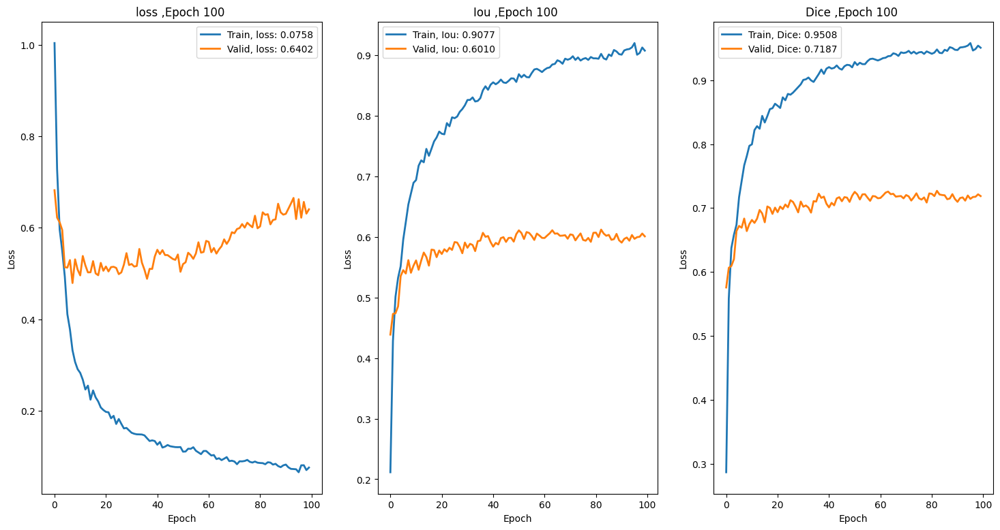

In [13]:
print(f'Validationset 기준 \nBest_epoch:{best_epoch_dice}, Best_IOU:{best_iou:.4f}, Best_DiceScore:{best_dice:.4f}')
#print(f'End_time: {end_time}')

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 9))           
for i, (metric, value) in enumerate(metrics.items()):
    axs[i].plot(np.arange(len(value[0])), value[0], label=f'Train, {metric}: {value[1]:.4f}', linewidth=2)
    axs[i].plot(np.arange(len(value[2])), value[2], label=f'Valid, {metric}: {value[3]:.4f}', linewidth=2)
    axs[i].set_xlabel('Epoch')
    axs[i].set_ylabel('Loss')
    axs[i].set_title(f'{metric} ,Epoch {epoch} ')
    axs[i].legend(loc='best')
plt.show()